### Filtering by geographical criteria

In [419]:
import numpy as np
import pandas as pd
pd.set_option('precision', 7)
import matplotlib.pyplot as plt
from matplotlib import cm, colors
#from matplotlib.pyplot import cm
#from geojson import Feature, FeatureCollection#, Point
import json
import geojson
from shapely.geometry import Point, Polygon, LineString, MultiPoint, mapping
from shapely.ops import nearest_points
import haversine
#import shapely
import geopandas as gpd
#import geojsonio
from copy import deepcopy
import folium
from IPython.display import HTML


I've exported __[El Retiro park shape](https://www.openstreetmap.org/way/4088755)__ in **GeoJSON** format from _OpenStreetMap_ by using the tool __[Overpass_turbo](http://overpass-turbo.eu/)__.
```c
// Retrieving El Retiro park from OSM
[out:json][timeout:25];
(
  // Query for El Retiro, whose way id is 4088755
  way(4088755);
);
// Print results
out body;
>;
// Returns geometry information of elements, but ignores the tags of the inner nodes
out skel qt;
```
![Retiro Park in OSM](img/osm-retiro-small.jpg)

In [4]:
#Let's start using GeoPandas. This is a very simple GeoDataFrame whose main geometry is the POLYGON with only one item: El Retiro
full_retiro=gpd.read_file('data/retiro.json')
full_retiro

,id,@id,access,alt_name,barrier,leisure,name,name:en,name:es,name:it,name:pl,name:ru,opening_hours,place,source:opening_hours,wikidata,wikipedia,geometry
0,way/4088755,way/4088755,public,Parque de El Retiro,fence,park,Parque del Retiro,El Retiro Park,Parque del Retiro,Parco del Retiro,Park Retiro,Буэн-Ретиро,Oct-Mar 06:00-22:00; Apr-Sep 06:00-24:00,suburb,survey,Q1131807,es:Parque del Retiro de Madrid,"POLYGON ((-3.6858982 40.4087709, -3.681906 40...."


In [5]:
#GeoPandas implements most of the Shapely functions to deal with geometries
#Accuracy of GPS is not perfect. In order to prevent misclassified points among the rides surrounding the park, actually not
#inside, we'll consider a narrower perimeter by leaving a buffer of around 25 meters to the park border.
narrow_retiro=full_retiro.buffer(-0.0003)
narrow_retiro

0    POLYGON ((-3.688492065704879 40.41705146092648...
dtype: object

In [6]:
#Back to dict format by using the Shapely function "mapping" then dumping to GeoJSON
#Let's take a look and make some manual adjustments on geojson.io

#json.dumps(mapping(full_retiro))
json.dumps(mapping(narrow_retiro))

'{"type": "FeatureCollection", "features": [{"id": "0", "type": "Feature", "properties": {}, "geometry": {"type": "Polygon", "coordinates": [[[-3.6884920657048785, 40.41705146092648], [-3.6883700816277276, 40.418165753370175], [-3.6883694284294943, 40.41817240414757], [-3.6882921834511726, 40.41906048150703], [-3.6882592113406454, 40.41907157635415], [-3.6881498113406455, 40.41911637635415], [-3.688115965461321, 40.41913278445701], [-3.687928465461321, 40.419238684457014], [-3.687906771591823, 40.41925218696872], [-3.687886305459, 40.41926748661589], [-3.6878672155427803, 40.41928447240097], [-3.6878444987612995, 40.41930648866623], [-3.6877890987612996, 40.41936018866623], [-3.687764296635444, 40.41938737282856], [-3.6876970966354436, 40.41947077282856], [-3.6876726215751394, 40.419506044036986], [-3.6876176215751397, 40.41959884403698], [-3.6876034144998266, 40.41962586110055], [-3.6875920263742485, 40.41965418199934], [-3.687560568184379, 40.419745598118496], [-3.686291441964994, 40

Some manual adjustments were made using the embedded editor on __[geojson.io](http://geojson.io)__ and saved as **_narrow_\__retiro.json_**

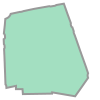

In [2]:
#Now we could reload our perimeter.
#In this case we won't keep it as a GeoDataFrame: we pass through GeoPandas to extract the POLYGON from the geometry GeoSeries
#in Shapely format.
retiro=gpd.read_file('data/narrow_retiro.json').geometry[0]
retiro

In [3]:
type(retiro)

shapely.geometry.polygon.Polygon

In [9]:
full_retiro.crs

{'init': 'epsg:4326'}

In [10]:
borde=full_retiro.difference(gpd.GeoSeries(retiro, crs={'init': 'epsg:4326'}))

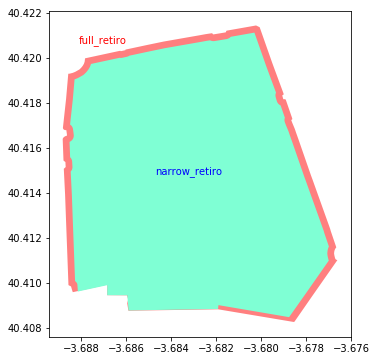

In [11]:
#Our Retiro perimeters
#Using a pure WGS 84 projection, that's why it looks "wider than on the typical maps", where Mercator projection is used.
ax=full_retiro.plot(figsize=(6,6), color='red', alpha=.5)
gpd.GeoSeries(retiro, crs={'init': 'epsg:4326'}).plot(ax=ax, color='aquamarine')
ax.text(0.1, 0.9, 'full_retiro', transform=ax.transAxes, color='red')
ax.text(0.35, 0.5, 'narrow_retiro', transform=ax.transAxes, color='blue')
_=plt.plot()
#borde.plot(ax=ax, color='black', alpha=.1)

#inner_retiro.plot(ax=ax, color='yellow', alpha=1)

**Projection on OpenStreetMaps**

![Retiro perimeters comparison](img/retiro_perimeters.png)

***
**<span style="color:red">Este filtrado de los trayectos sin GPS podría dejarlo en el notebook anterior, la verdad.</span>**

**<span style="color:red">fin</span>**
***

#### Listado de estaciones de BiciMAD
Con el objetivo de completar los track GPS y, posteriormente, crear features interesantes, se necesita el listado detallado de estaciones de BiciMAD repartidas por la ciudad: **172** en agosto de 2018.
Se dispone de dos fuentes de datos con los identificadores, nombres y localizaciones de las estaciones:
 * Datos estáticos publicados en la web de datos de abiertos del Ayuntamiento de Madrid (***bases_bicimad.csv***)
 * Datos generados mensualmente (agosto 2018) con los datos de ocupación de cada estación por horas (***Bicimad_Estacions_201808.json***)
 
Vamos a leer los datos y compararlos sobre el mapa para elegir cuáles utilizar. 

In [4]:
### DATOS MENSUALES

#Leo y tomo la primera línea del json (estado de las estaciones la primera horas del mes), no necesito más
stations=next(pd.read_json('data/Bicimad_Estacions_201808.json', lines=True, chunksize=1))['stations']

In [5]:
stations=pd.DataFrame(stations[0])
stations

,activate,address,dock_bikes,free_bases,id,latitude,light,longitude,name,no_available,number,reservations_count,total_bases
0,1,Puerta del Sol nº 1,11,11,1,40.4168961,2,-3.7024255,Puerta del Sol A,0,1a,0,24
1,1,Puerta del Sol nº 1,10,14,2,40.4170009,2,-3.7024207,Puerta del Sol B,0,1b,0,24
2,1,Calle Miguel Moya nº 1,1,23,3,40.4205886,0,-3.7058415,Miguel Moya,0,2,0,24
3,1,Plaza del Conde Suchil nº 2-4,8,10,4,40.4302937,2,-3.7069171,Plaza Conde Suchil,0,3,0,18
4,1,Calle Manuela Malasaña nº 5,0,23,5,40.4285524,0,-3.7025875,Malasaña,0,4,0,24
5,1,Calle Fuencarral nº 108,5,21,6,40.4285280,0,-3.7020599,Fuencarral,0,5,0,27
6,1,Calle Hortaleza nº 63,2,22,7,40.4241480,0,-3.6984470,Colegio Arquitectos,0,6,0,24
7,1,Calle Hortaleza nº 75,5,16,8,40.4251906,0,-3.6977715,Hortaleza,0,7,0,21
8,1,Plaza de Alonso Martínez nº 5,3,21,9,40.4278682,0,-3.6954403,Alonso Martínez,0,8,0,24
9,1,Plaza de San Miguel nº 9,6,18,10,40.4156057,0,-3.7095084,Plaza de San Miguel,0,9,0,24


In [6]:
#Latitude and longitude must be numeric in order to do geometric manipulations
stations[['latitude','longitude']]=stations[['latitude','longitude']].astype('float')
stations

,activate,address,dock_bikes,free_bases,id,latitude,light,longitude,name,no_available,number,reservations_count,total_bases
0,1,Puerta del Sol nº 1,11,11,1,40.4168961,2,-3.7024255,Puerta del Sol A,0,1a,0,24
1,1,Puerta del Sol nº 1,10,14,2,40.4170009,2,-3.7024207,Puerta del Sol B,0,1b,0,24
2,1,Calle Miguel Moya nº 1,1,23,3,40.4205886,0,-3.7058415,Miguel Moya,0,2,0,24
3,1,Plaza del Conde Suchil nº 2-4,8,10,4,40.4302937,2,-3.7069171,Plaza Conde Suchil,0,3,0,18
4,1,Calle Manuela Malasaña nº 5,0,23,5,40.4285524,0,-3.7025875,Malasaña,0,4,0,24
5,1,Calle Fuencarral nº 108,5,21,6,40.4285280,0,-3.7020599,Fuencarral,0,5,0,27
6,1,Calle Hortaleza nº 63,2,22,7,40.4241480,0,-3.6984470,Colegio Arquitectos,0,6,0,24
7,1,Calle Hortaleza nº 75,5,16,8,40.4251906,0,-3.6977715,Hortaleza,0,7,0,21
8,1,Plaza de Alonso Martínez nº 5,3,21,9,40.4278682,0,-3.6954403,Alonso Martínez,0,8,0,24
9,1,Plaza de San Miguel nº 9,6,18,10,40.4156057,0,-3.7095084,Plaza de San Miguel,0,9,0,24


In [7]:
#No hacen falta todas las columnas
stations.drop(stations.columns.difference(['address','id','latitude','longitude','name','number']), axis=1, inplace=True)

In [8]:
stations.dtypes

address       object
id             int64
latitude     float64
longitude    float64
name          object
number        object
dtype: object

In [9]:
#Formateo de las direcciones en mayúculas y sin caracteres conflictivos para la representación en Folium
stations['address']=stations['address'].str.replace('nº ','').str.replace('\'',' ').str.upper()
stations

,address,id,latitude,longitude,name,number
0,PUERTA DEL SOL 1,1,40.4168961,-3.7024255,Puerta del Sol A,1a
1,PUERTA DEL SOL 1,2,40.4170009,-3.7024207,Puerta del Sol B,1b
2,CALLE MIGUEL MOYA 1,3,40.4205886,-3.7058415,Miguel Moya,2
3,PLAZA DEL CONDE SUCHIL 2-4,4,40.4302937,-3.7069171,Plaza Conde Suchil,3
4,CALLE MANUELA MALASAÑA 5,5,40.4285524,-3.7025875,Malasaña,4
5,CALLE FUENCARRAL 108,6,40.4285280,-3.7020599,Fuencarral,5
6,CALLE HORTALEZA 63,7,40.4241480,-3.6984470,Colegio Arquitectos,6
7,CALLE HORTALEZA 75,8,40.4251906,-3.6977715,Hortaleza,7
8,PLAZA DE ALONSO MARTÍNEZ 5,9,40.4278682,-3.6954403,Alonso Martínez,8
9,PLAZA DE SAN MIGUEL 9,10,40.4156057,-3.7095084,Plaza de San Miguel,9


In [10]:
#Detalle completo
with pd.option_context('display.max_rows', None):
    print(stations)

                                       address   id    latitude  longitude  \
0                             PUERTA DEL SOL 1    1  40.4168961 -3.7024255   
1                             PUERTA DEL SOL 1    2  40.4170009 -3.7024207   
2                          CALLE MIGUEL MOYA 1    3  40.4205886 -3.7058415   
3                   PLAZA DEL CONDE SUCHIL 2-4    4  40.4302937 -3.7069171   
4                     CALLE MANUELA MALASAÑA 5    5  40.4285524 -3.7025875   
5                         CALLE FUENCARRAL 108    6  40.4285280 -3.7020599   
6                           CALLE HORTALEZA 63    7  40.4241480 -3.6984470   
7                           CALLE HORTALEZA 75    8  40.4251906 -3.6977715   
8                   PLAZA DE ALONSO MARTÍNEZ 5    9  40.4278682 -3.6954403   
9                        PLAZA DE SAN MIGUEL 9   10  40.4156057 -3.7095084   
10             CALLE MARQUÉS DE LA ENSENADA 16   11  40.4250863 -3.6918807   
11                         CALLE SAN ANDRÉS 18   12  40.4269483 

In [579]:
### DATOS ESTÁTICOS
#Ajuste del separador (;) y encoding necesario
static_stations=pd.read_csv('bicimad/bases/bases_bicimad.csv', sep=';', encoding='iso-8859-1')

In [580]:
#Formateo de las direcciones en mayúculas y sin caracteres conflictivos para la representación en Folium
static_stations['DIRECCION']=static_stations['DIRECCION'].str.replace('nº ','').str.replace('\'',' ').str.upper()

In [585]:
#Detalle completo
with pd.option_context('display.max_rows', None):
    print(static_stations)

             Número      Gis_X       Gis_Y  Fecha de Alta  \
0              001a  440394,55  4474280,53          41813   
1              001b  440404,21  4474287,39          41813   
2                 2  440134,83  4474678,23          41813   
3                 3  440012,98  4475760,68          41813   
4                 4   440396,4  4475565,36          41813   
5                 5   440446,9  4475539,69          41813   
6                 6  440754,26  4475071,08          41813   
7                 7  440811,97  4475187,49          41813   
8                 8  441020,56  4475463,16          41813   
9                 9  439813,51  4474129,47          41813   
10               10  441292,12  4475204,43          41813   
11               11  440314,86  4475395,19          41813   
12               12  440095,53  4475560,73          41813   
13               13  439733,78  4475434,65          41813   
14               14  439478,78  4475285,54          41813   
15               15  440

Se visualiza la localización de las estaciones desde ambas fuentes de datos: marcadores verdes para  los <font color='green'><b>datos estáticos</b></font> y marcadores rojos para los <font color='red'><b>datos mensuales</b></font>. Número de estación como tooltip.<br>
Hay diferencias en la posición expresada en cada juego de datos, ya sea porque las coordenadas se han obtenido de orígenes distintos, o bien a causa de la precisión decimal en cada caso.
Aunque ambos datasets contienen 172 estaciones, se observa un par de discrepancias: 
 * Estación 020 ampliada se trata como un duplicado en los datos estáticos, y como una sola en los datos mensuales.
 * Estación 106 ampliada se trata como una sola en los datos estáticos, y duplicada en los datos mensuales.

Dado que **únicamente los datos mensuales contienen la correspondencia con el id técnico del que disponemos en el detalle de trayectos**, y como las diferencias en el posicionamiento no son considerables, utilizaremos los datos mensuales como referencia (concretamente los vigentes el 1 de agosto de 2018).

In [586]:
stations_map = folium.Map([40.42966829318199, -3.6893033981323238], zoom_start=13, min_zoom=13)

for  i, row in stations.iterrows():
    folium.Marker((row.latitude, row.longitude), tooltip=row.number, icon=folium.Icon(color='red', icon='bicycle', prefix='fa')).add_to(stations_map)

for  i, row in static_stations.iterrows():
    folium.Marker((row.LATITUD, row.LONGITUD), tooltip=row.Número, icon=folium.Icon(color='green', icon='bicycle', prefix='fa')).add_to(stations_map)

stations_map

In [12]:
#Confirmamos que no hay ids repetidos en el listado de estaciones
stations['id'].duplicated(keep=False).any()

False

El track GPS del que dispone cada trayecto consta de todos los puntos intermedios pero, por alguna razón, **no incluye el origen y el destino** del mismo. No obstante podemos inferir esos dos puntos pues sí conocemos las estaciones de origen y destino.
De modo que vamos a completar el track con las coordenadas de las estaciones de origen _(primer punto, t=0)_ y destino _(último punto, t=travel_\__time)_, sirviéndonos de los datos importados anteriormente. 

Tener el track completo será interesante para crear algunas features (por ejemplo distancia líneal total entre puntos) o para hacer representaciones más precisas en el mapa.

In [19]:
#This function creates an improved version of the GPS track by adding the origin and destination points,
#based on the stations information.

def improve_track(ride, stations):
    station_orig = stations[stations['id'] == ride.idunplug_station].iloc[0]
    station_dest = stations[stations['id'] == ride.idplug_station].iloc[0]
    #Origin
    feature_orig={'geometry': {'type': 'Point', 'coordinates': [station_orig.longitude, station_orig.latitude]},
                  'type': 'Feature',
                  'properties': {'var': station_orig.address,
                                 'speed': 0,
                                 'secondsfromstart': 0}}
    #Destination
    feature_dest={'geometry': {'type': 'Point', 'coordinates': [station_dest.longitude, station_dest.latitude]},
                  'type': 'Feature',
                  'properties': {'var': station_dest.address,
                                 'speed': 0,
                                 'secondsfromstart': ride.travel_time}}
    #Object duplication so the original track is not lost
    improved_track = deepcopy(ride.track)
    improved_track['features'].insert(0,feature_dest)
    improved_track['features'].append(feature_orig)
    return improved_track

***
*** Prueba track enriquecido ***

***

In [20]:
#The dataframe containing the enhanced tracks is backed up in order to not repeat that heavy treatment in future runs
# /!\ Wall time: 52s
#%time rides.to_json('data/cleanFullTracksAugust.json', orient='records', date_format='iso', lines=True)

In [21]:
#Esta es la lectura de una versión limpia pero sólo con los trayectos CON track y además la versión enriquecida (full_track)
# /!\ Wall time: 1min 31s
#rides=pd.read_json('data/good/cleanFullTracksAugust.json', lines=True, dtype={'zip_code':object}, convert_dates=['unplug_hourTime'])

In [40]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(rides.idunplug_station.value_counts().sort_index())

1      2748
2      1260
3      1531
4       914
5       963
6      1733
7       995
8      1202
9      2058
10     1282
11      680
12     1074
13     1637
14     1120
15      731
16      982
17     1204
18     1252
19     2563
20      939
21     1308
25     1273
26     1886
27     1188
28      305
29      516
30     1468
31     1924
32      516
33      960
34      737
35      895
36      988
38     2136
39      832
40      821
41     2495
42      790
43     2799
44     1583
45      781
46     2119
47     1433
48     1222
49     2482
50     1263
51     1200
52     1962
53     2194
54     1182
55     1420
56     1960
57     2473
58     2136
59     2314
60     1242
61      331
62     1720
63     1197
64     2848
65     1235
66     1073
67     1213
69      995
71     1250
72      796
73     1475
74     1788
75     1400
76     1193
77     1208
78     1145
79     1848
80     1317
81     1168
82     1948
83     2411
84     1589
85      733
86     1153
87      834
88      364
89     1063
90  

In [42]:
#JSON I/O process couldn't deal with the timezone. We localize our datetime on the Central European Time.
rides['unplug_hourTime']=pd.Series(pd.DatetimeIndex(rides['unplug_hourTime']).tz_localize('UTC').tz_convert('CET'))

In [43]:
#pandas-dev Issue #21892 doesn't allow to deal with categories as a dtype on read_json, so we make the conversion here
rides[['ageRange','idplug_station','idunplug_station','user_type']]=\
rides[['ageRange','idplug_station','idunplug_station','user_type']].astype('category')

In [44]:
#We check the right types were kept.
#Strings and dict as objets, time travel as a number, datetime on the right timezone and four categories with well-known values: 
rides.dtypes

_id                              object
ageRange                       category
full_track                       object
idplug_station                 category
idunplug_station               category
track                            object
travel_time                       int64
unplug_hourTime     datetime64[ns, CET]
user_day_code                    object
user_type                      category
zip_code                         object
dtype: object

In [45]:
rides.count()

_id                 224536
ageRange            224536
full_track          224536
idplug_station      224536
idunplug_station    224536
track               224536
travel_time         224536
unplug_hourTime     224536
user_day_code       224536
user_type           224536
zip_code            115959
dtype: int64

###### Tipos de usuario
**1**: Usuario anual (abonado)
**2**: Usuario ocasional
**3**: Trabajador de la empresa

In [46]:
rides['user_type'].value_counts()

1    202609
3     16186
2      5741
Name: user_type, dtype: int64

**<span style="color:red">Introducir aquí un plot al menos ilustrando las particularidades de los user_type=3</span>** (M-30 y demás)

***

Para nuestro análisis vamos a descartar los movimientos realizados por trabajadores de la empresa pues parecen tratarse de desplazamientos para reabastecer estaciones o por motivos de mantenimiento.

In [47]:
#We'll work only with rides by "real" users
rides = rides.query('user_type != 3')

In [48]:
rides['user_type'].value_counts()

1    202609
2      5741
3         0
Name: user_type, dtype: int64

In [49]:
rides.describe()

,travel_time
count,208350.000000
mean,979.998435
std,1246.950072
min,23.000000
25%,461.000000
50%,681.000000
75%,1017.000000
max,21598.000000


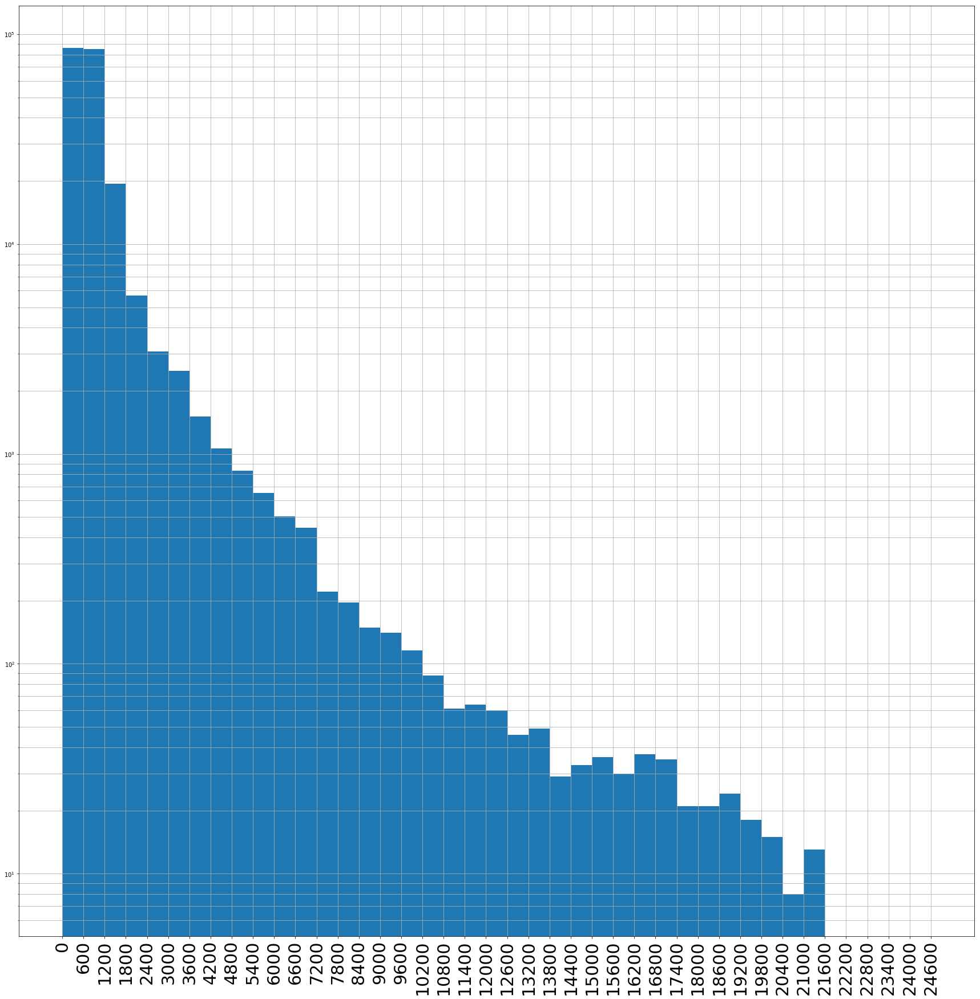

In [414]:
fig, ax = plt.subplots(figsize=(30,30))
rides['travel_time'].hist(ax=ax, bins=np.arange(0, 25000, 600))
ax.set_yscale('log')
ax.set_xticks(np.arange(0, 25000, 600))
ax.grid(which='minor')
ax.set_xticklabels(np.arange(0, 25000, 600), rotation=90, fontsize=30)
#ax.set_yticklabels(y_ticks, rotation=0, fontsize=8)
_ = plt.plot()

In [31]:
#Hemos exportado los datos para consultarlos rápidamente si hace falta y podemos prescindir de este objeto
del(tech_rides)

In [24]:
rides.count()

_id                 208350
ageRange            208350
full_track          208350
idplug_station      208350
idunplug_station    208350
track               208350
travel_time         208350
unplug_hourTime     208350
user_day_code       208350
user_type           208350
zip_code            114556
dtype: int64

#### Geographical outliers
Let's ensure all the rides stay inside the city. Same procedure to export the municipality of Madrid perimeter from OSM on GeoJSON format.

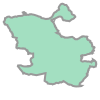

In [50]:
madrid=gpd.read_file('data/madrid.json').geometry[0]
madrid

In [51]:
madrid.wkt #So here it is... so tricky

'POLYGON ((-3.5311901 40.4200833, -3.5308782 40.4183949, -3.5305482 40.4165621, -3.5302303 40.4147088, -3.5304147 40.4147078, -3.5307286 40.4146422, -3.5309531 40.414563, -3.5313036 40.4144154, -3.5316854 40.4142916, -3.5322965 40.4141597, -3.5327887 40.4141076, -3.5333217 40.41411, -3.5339655 40.4141774, -3.5344149 40.4142421, -3.5351716 40.4144134, -3.5356265 40.4131503, -3.5357326 40.4131369, -3.535862 40.4130956, -3.5359677 40.4130405, -3.5360659 40.4129702, -3.536164 40.4128418, -3.536211 40.4127163, -3.5362286 40.4126117, -3.5362057 40.4125154, -3.536474 40.4125723, -3.53676 40.4125999, -3.5370384 40.4125969, -3.537309 40.4125551, -3.5374842 40.4125074, -3.5376659 40.4124237, -3.5377865 40.412354, -3.5378486 40.4122837, -3.537888 40.4121885, -3.537862 40.4118206, -3.5379001 40.4117363, -3.5379593 40.4116747, -3.5382799 40.4114284, -3.5383757 40.4114115, -3.5386738 40.4114384, -3.5390808 40.4115436, -3.5394973 40.4116295, -3.5395794 40.4116262, -3.5396553 40.4115945, -3.5397366 40

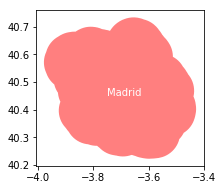

In [52]:
#### Madrid area roughly simplified: calculations will be lighter and we dont need much precison with this
#A buffer of around 8 kms is added, trying to roughly cover Madrid metropolitan area
madrid=madrid.buffer(0.09)
ax=gpd.GeoSeries(madrid).plot(figsize=(3,3), color='red', alpha=.5)
ax.text(0.42, 0.45, 'Madrid', transform=ax.transAxes, color='white')
_=plt.plot()

<img src="img/roughly_Madrid.png" width=500 align=left>

Definimos la función que determina si un trayecto no ha salido del municipio de Madrid. El criterio es verificar que **todos** los puntos del track GPS está dentro del municipio (***madrid***)

In [53]:
def is_in_Madrid(path=None):
    points=MultiPoint(gpd.GeoDataFrame.from_features(path['features']).geometry)
    return madrid.contains(points) #"contains" means ALL the MultiPoint remains inside the boundaries of Madrid

Let's create a fictional ride with **one point** so far away

In [ ]:
my_outlier={'type': 'FeatureCollection',
 'features': [{'geometry': {'type': 'Point',
    'coordinates': [-3.7088337, 40.4112744]},
   'type': 'Feature',
   'properties': {'var': 'PLAZA DE LA CEBADA 16 ',
    'speed': 0,
    'secondsfromstart': 228}},
  {'geometry': {'type': 'Point', 'coordinates': [-3.7078158, 40.4127144997]},
   'type': 'Feature',
   'properties': {'var': '28005,ES,Madrid,Madrid,CALLE SAN BRUNO 1,Madrid',
    'speed': 6.19,
    'secondsfromstart': 190}},
  {'geometry': {'type': 'Point', 'coordinates': [-3.7024255, 40.4168961]},
   'type': 'Feature',
   'properties': {'var': 'PUERTA DEL SOL 1',
    'speed': 0,
    'secondsfromstart': 0}}]}

In [ ]:
my_outlier['features'].insert(3, {'geometry': {'type': 'Point', 'coordinates': [-3.80158, 40.2427144997]},
   'type': 'Feature',
   'properties': {'var': 'FAR AWAY!',
    'speed': 1,
    'secondsfromstart': 100}})

In [ ]:
gpd.GeoSeries.plot

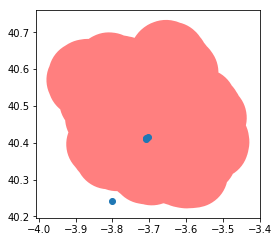

In [57]:
ax=gpd.GeoSeries(madrid).plot(figsize=(4,4), color='red', alpha=.5)
gpd.GeoDataFrame.from_features(my_outlier['features']).geometry.plot(ax=ax)
_=plt.show()

In [58]:
is_in_Madrid(my_outlier)

False

In [59]:
# /!\ Wall time: 4min 11s
in_Madrid = pd.Series(map(is_in_Madrid, rides['full_track']))

In [60]:
in_Madrid.value_counts()

True     208324
False        26
dtype: int64

In [61]:
outside_rides = rides[~in_Madrid.values]

In [62]:
#Rides getting outside Madrid!
rides[~in_Madrid.values]

,_id,ageRange,full_track,idplug_station,idunplug_station,track,travel_time,unplug_hourTime,user_day_code,user_type,zip_code
2723,5b6779132f384302541d7725,0,"{'type': 'FeatureCollection', 'features': [{'g...",157,63,"{'type': 'FeatureCollection', 'features': [{'g...",535,2018-08-01 10:00:00+02:00,4ca7ee690da423ec90cd1d92e40ee8a4462006939e83b3...,1,None
3809,5b67791c2f384302541d7e26,0,"{'type': 'FeatureCollection', 'features': [{'g...",95,93,"{'type': 'FeatureCollection', 'features': [{'g...",426,2018-08-01 13:00:00+02:00,e7328d6f95f41c740773b6a70b957661aeff1bdc75eda9...,1,None
19110,5b68cac52f38433e00de10cd,4,"{'type': 'FeatureCollection', 'features': [{'g...",57,33,"{'type': 'FeatureCollection', 'features': [{'g...",363,2018-08-02 20:00:00+02:00,39a17453e3e9d5e696ccf9ebe31e903b881a8c10a32e29...,1,28004
20598,5b6a1c1a2f38434d8862b32e,3,"{'type': 'FeatureCollection', 'features': [{'g...",83,27,"{'type': 'FeatureCollection', 'features': [{'g...",635,2018-08-02 23:00:00+02:00,0652939dc3edd4e0c1e3e7dbcba280badc22daf56a523e...,1,28007
25280,5b6a1c3d2f38434d8862cd7f,4,"{'type': 'FeatureCollection', 'features': [{'g...",79,112,"{'type': 'FeatureCollection', 'features': [{'g...",595,2018-08-03 14:00:00+02:00,699e0ad55f894ad26e97f3f0c1978b5aeea4359c493371...,1,28028
52704,5b6f62812f38434d381dc697,4,"{'type': 'FeatureCollection', 'features': [{'g...",55,122,"{'type': 'FeatureCollection', 'features': [{'g...",1731,2018-08-07 12:00:00+02:00,90b4560b05a5061027c7a203a91662589226ac5dbc75d4...,1,28005
58282,5b6f62a62f38434d381de368,5,"{'type': 'FeatureCollection', 'features': [{'g...",175,38,"{'type': 'FeatureCollection', 'features': [{'g...",300,2018-08-07 23:00:00+02:00,0f80c3bbcfb78d9a3ae2dd51a129d6205aa2dad7ca82e0...,1,28005
58378,5b6f62a72f38434d381de3fa,0,"{'type': 'FeatureCollection', 'features': [{'g...",13,43,"{'type': 'FeatureCollection', 'features': [{'g...",683,2018-08-07 23:00:00+02:00,039b58abd14664ce15d2b2c1eb2748bc7706b599ecc00f...,1,None
58540,5b7108142f38433dd87ae40b,0,"{'type': 'FeatureCollection', 'features': [{'g...",130,13,"{'type': 'FeatureCollection', 'features': [{'g...",1350,2018-08-07 23:00:00+02:00,ff9daac6e90521a188044d9f14ea25df459337bc484b6a...,1,None
69227,5b7205482f3843505c6bd361,5,"{'type': 'FeatureCollection', 'features': [{'g...",140,132,"{'type': 'FeatureCollection', 'features': [{'g...",5668,2018-08-09 07:00:00+02:00,894df72da62c94ebdea489590760465966cf96d174b8ca...,1,28028


In [63]:
outsideRides = gpd.GeoSeries()

In [64]:
for r in rides[~in_Madrid.values]['full_track'] :
    geoRide=LineString(gpd.GeoDataFrame.from_features(r['features'])['geometry'])
    outsideRides=outsideRides.append(gpd.GeoSeries(geoRide), ignore_index=True)

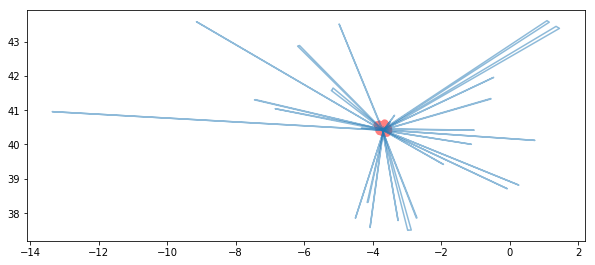

In [65]:
ax=gpd.GeoSeries(madrid).plot(figsize=(10,10), color='red', alpha=.5)
for r in rides[~in_Madrid.values]['full_track'] :
    gpd.GeoSeries(LineString(gpd.GeoDataFrame.from_features(r['features'])['geometry'])).plot(ax=ax, alpha=.5)

In [68]:
outliers = folium.Map([40.4155068, -3.6840015], zoom_start=7)

#color=iter(cm.rainbow(np.linspace(0,1,len(outsideRides))))

for p in outsideRides:
    r=folium.features.GeoJson(json.dumps(mapping(p)))
    r.style_function=lambda x: {'color':'blue', 'weight':1, 'opacity':.5}
    outliers.add_child(r)
outliers

In [69]:
rides[~in_Madrid.values].index

Int64Index([  2723,   3809,  19110,  20598,  25280,  52704,  58282,  58378,
             58540,  69227,  79234,  80601,  86601,  92892,  92916, 119161,
            141819, 145213, 158720, 160495, 160594, 160745, 171461, 208002,
            216317, 216352],
           dtype='int64')

In [70]:
rides.drop(rides[~in_Madrid.values].index, inplace=True).reset_index(drop=True, inplace=True)

In [71]:
len(rides)

208324

In [72]:
rides.dtypes

_id                              object
ageRange                       category
full_track                       object
idplug_station                 category
idunplug_station               category
track                            object
travel_time                       int64
unplug_hourTime     datetime64[ns, CET]
user_day_code                    object
user_type                      category
zip_code                         object
dtype: object

### Retiro tracks
Now let's pick the rides that got inside El Retiro, at least for a while.

Definimos la función que determina si un trayecto ha pasado o no por el Retiro. El criterio es verificar si **algún** punto del track GPS está dentro del perímetro del parque (***narrow_retiro***)

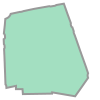

In [74]:
retiro

In [75]:
def intersectsRetiro(path=None):
    points=MultiPoint(gpd.GeoDataFrame.from_features(path['features']).geometry)
    return retiro.intersects(points)

In [77]:
# /!\ Wall time: 3min 52s
%time rides['in_Retiro']=pd.Series(map(intersectsRetiro, rides['full_track']))

Wall time: 3min 51s


In [79]:
#So around 10% of the rides passed through El Retiro park
print('Count:\n',rides['in_Retiro'].value_counts())
print('Proportion:\n',rides['in_Retiro'].value_counts(normalize=True))

Count:
 False    186963
True      21361
Name: in_Retiro, dtype: int64
Proportion:
 False    0.897463
True     0.102537
Name: in_Retiro, dtype: float64


KeyboardInterrupt: 

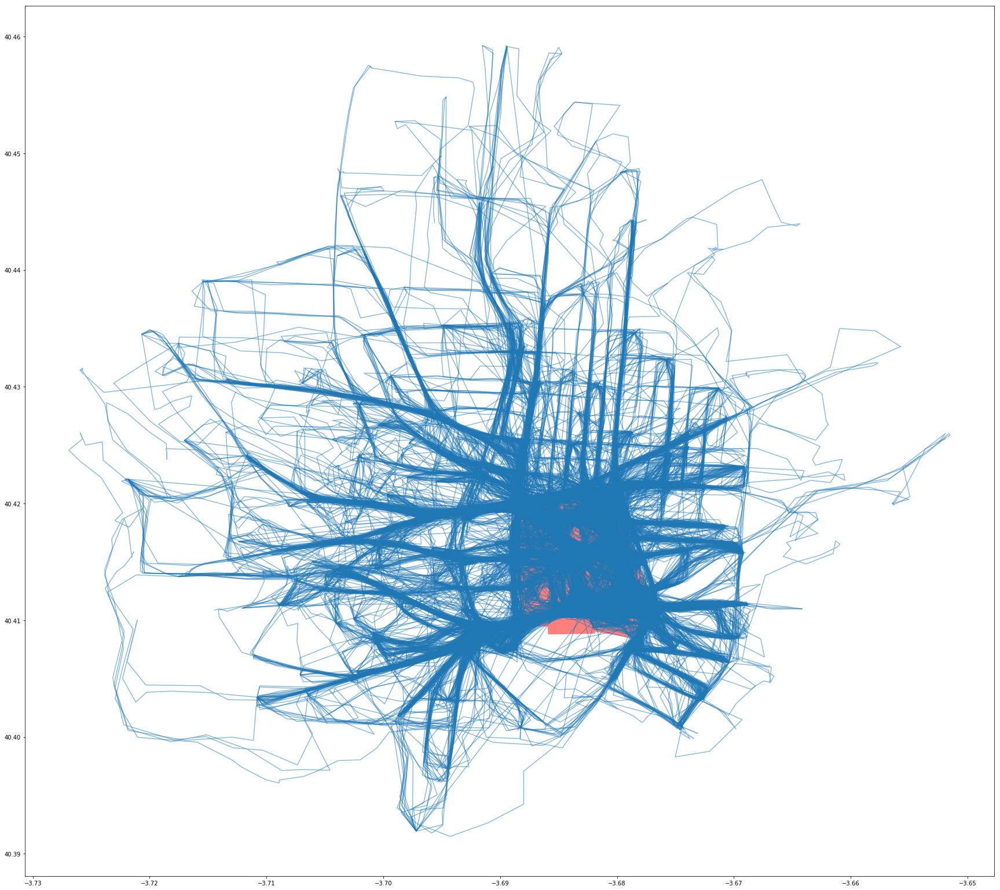

In [525]:
ax=gpd.GeoSeries(madrid).plot(figsize=(10,10), color='red', alpha=.5)
#for r in rides[~in_Madrid.values]['full_track'] :
    gpd.GeoSeries(LineString(gpd.GeoDataFrame.from_features(r['features'])['geometry'])).plot(ax=ax, alpha=.5)

***
**<span style="color:red">Muestras para verificar la función de pertenencia con algunos plots</span>**


In [458]:
sample=rides[rides.user_type==1].sample(3000,random_state=194).reset_index()

In [459]:
sample.head()

,level_0,index,_id,ageRange,full_track,idplug_station,idunplug_station,track,travel_time,unplug_hourTime,user_day_code,user_type,zip_code,shapely_track,multiple_rides
0,6421,64493,5b7205472f3843505c6bd2a2,5,"{'type': 'FeatureCollection', 'features': [{'g...",110,89,"{'type': 'FeatureCollection', 'features': [{'g...",818,2018-08-09 08:00:00+02:00,7eb5cdc7fe2df50d062a160875c8a57e8cb1347a03aba1...,1,28007,"LINESTRING (-3.6873922 40.4267905, -3.687749 4...",True
1,416,3407,5b67791e2f384302541d7f5a,0,"{'type': 'FeatureCollection', 'features': [{'g...",79,105,"{'type': 'FeatureCollection', 'features': [{'g...",6739,2018-08-01 12:00:00+02:00,a898315ecfb53eed8ef5eb9b8de6744d8a8b270ed25e25...,1,None,"LINESTRING (-3.6784838 40.4082805, -3.67781579...",False
2,1110,9531,5b6779442f384302541d9eb4,3,"{'type': 'FeatureCollection', 'features': [{'g...",56,103,"{'type': 'FeatureCollection', 'features': [{'g...",835,2018-08-01 23:00:00+02:00,a6966e1c8b6fbfd820dd98d33449bf26403d1ec0800719...,1,28014,"LINESTRING (-3.7007164 40.4144226, -3.70177649...",False
3,1937,16993,5b68cabe2f38433e00de0bd4,4,"{'type': 'FeatureCollection', 'features': [{'g...",83,92,"{'type': 'FeatureCollection', 'features': [{'g...",662,2018-08-02 19:00:00+02:00,9162b026342c9fbaf0966db9e1513a2e7916ccee26cd5c...,1,28001,"LINESTRING (-3.6803874 40.4051451, -3.68029859...",False
4,21281,207255,5b8b11a22f384363b0a2381d,3,"{'type': 'FeatureCollection', 'features': [{'g...",12,77,"{'type': 'FeatureCollection', 'features': [{'g...",1172,2018-08-28 21:00:00+02:00,9430d1d5056e45c111d14a984a9a1a99b0eaaed3c96c93...,1,28007,"LINESTRING (-3.7035918 40.4269483, -3.7035083 ...",False


In [460]:
sample['inRetiro'].value_counts()

KeyError: 'inRetiro'

In [461]:
pointsInRetiro=gpd.GeoSeries()
pointsNotInRetiro=gpd.GeoSeries()

In [462]:
for r in sample[sample['inRetiro']==True]['full_track'] :
    geoRide=gpd.GeoSeries(LineString(gpd.GeoDataFrame.from_features(r['features'], crs='WGS84')['geometry']))
    pointsInRetiro=pointsInRetiro.append(geoRide, ignore_index=True)

In [127]:
for r in sample[sample['inRetiro']==False]['full_track'] :
    geoRide=gpd.GeoSeries(gpd.GeoDataFrame.from_features(r['features'], crs='WGS84')['geometry'])
    pointsNotInRetiro=pointsNotInRetiro.append(geoRide, ignore_index=True)

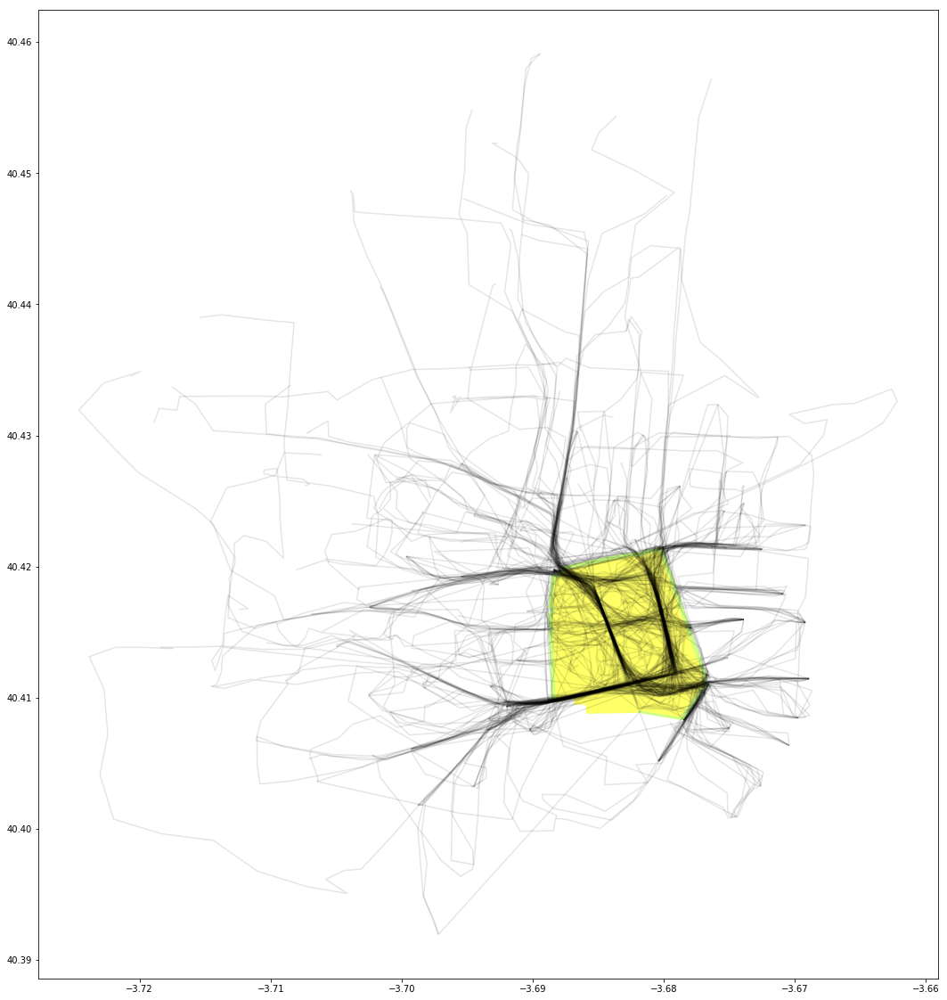

In [463]:
ax=raw_retiro.plot(figsize=[20,20], color='yellow', alpha=0.6)
#add_basemap(ax, zoom=10)
retiro(ax=ax, color='red', alpha=0.2)
pointsInRetiro.plot(ax=ax, color='black', alpha=0.1)
#pointsNotInRetiro.plot(ax=ax, color='red', alpha=0.1)

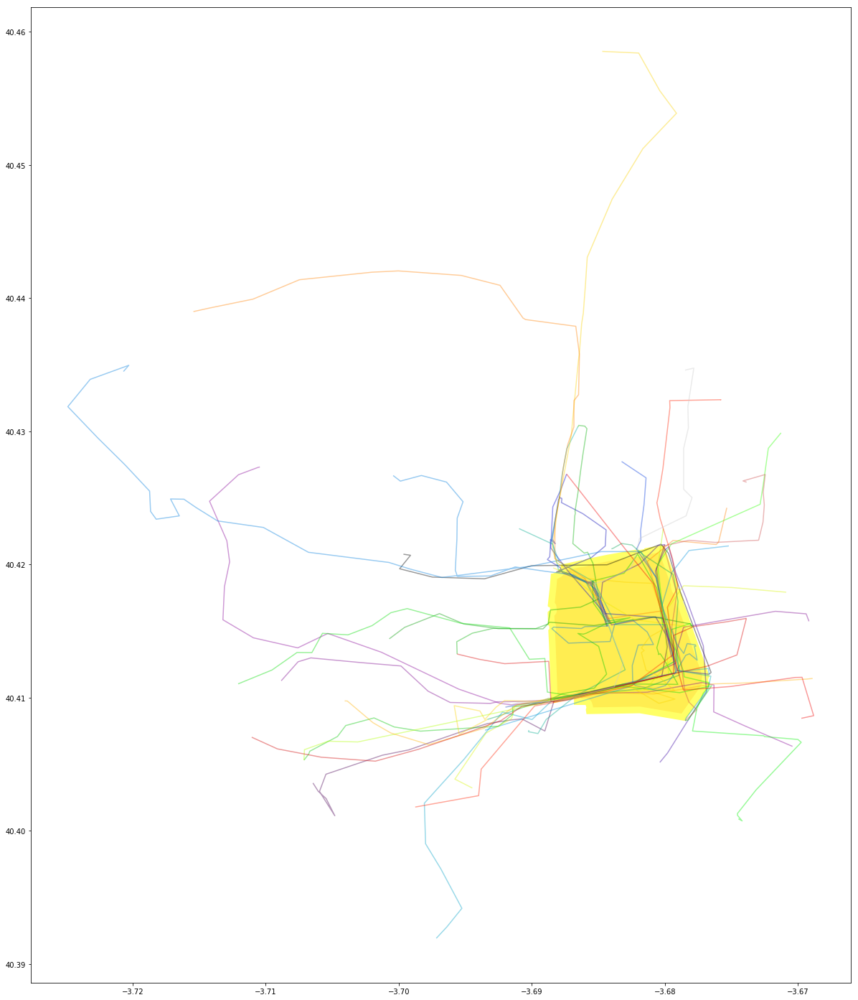

In [326]:
ax=raw_retiro.plot(figsize=[25,25], color='yellow', alpha=0.6)
#add_basemap(ax, zoom=10)
raw_retiro.buffer(-0.0005).plot(ax=ax, color='orange', alpha=0.2)
pointsInRetiro.plot(ax=ax, cmap='nipy_spectral', alpha=0.4)
#pointsNotInRetiro.plot(ax=ax, color='red', alpha=0.1)

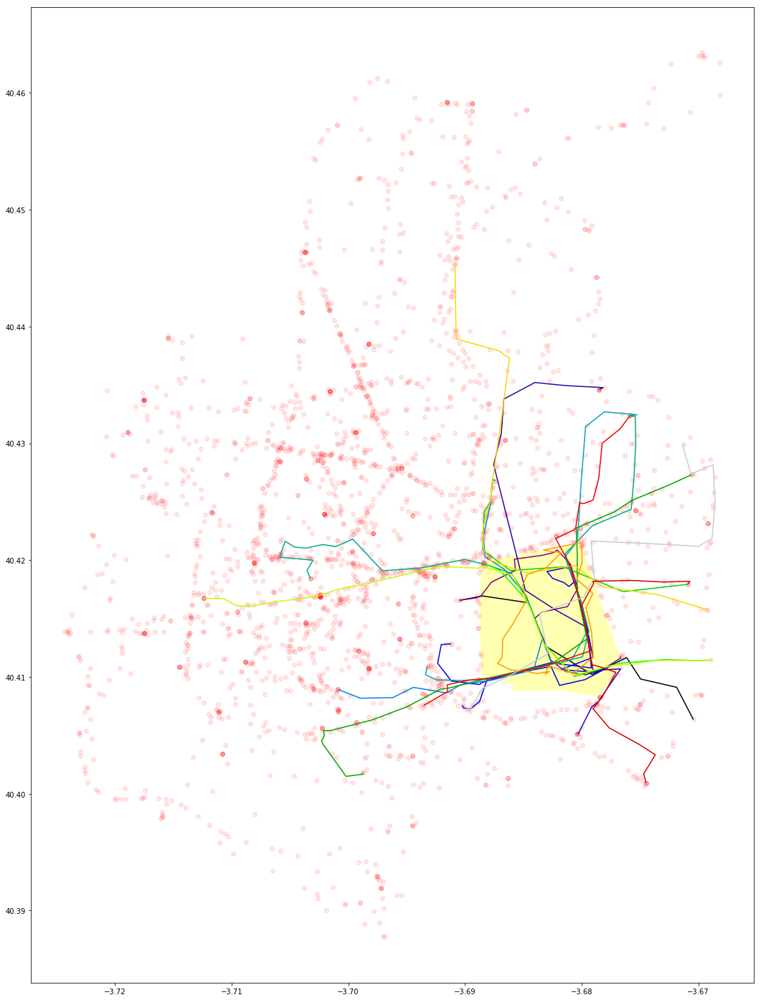

In [231]:
ax=retiro.plot(figsize=[25,25], color='yellow', alpha=0.3)
#add_basemap(ax, zoom=10)
pointsInRetiro.plot(ax=ax, cmap='nipy_spectral', alpha=1)
pointsNotInRetiro.plot(ax=ax, color='red', alpha=0.1)

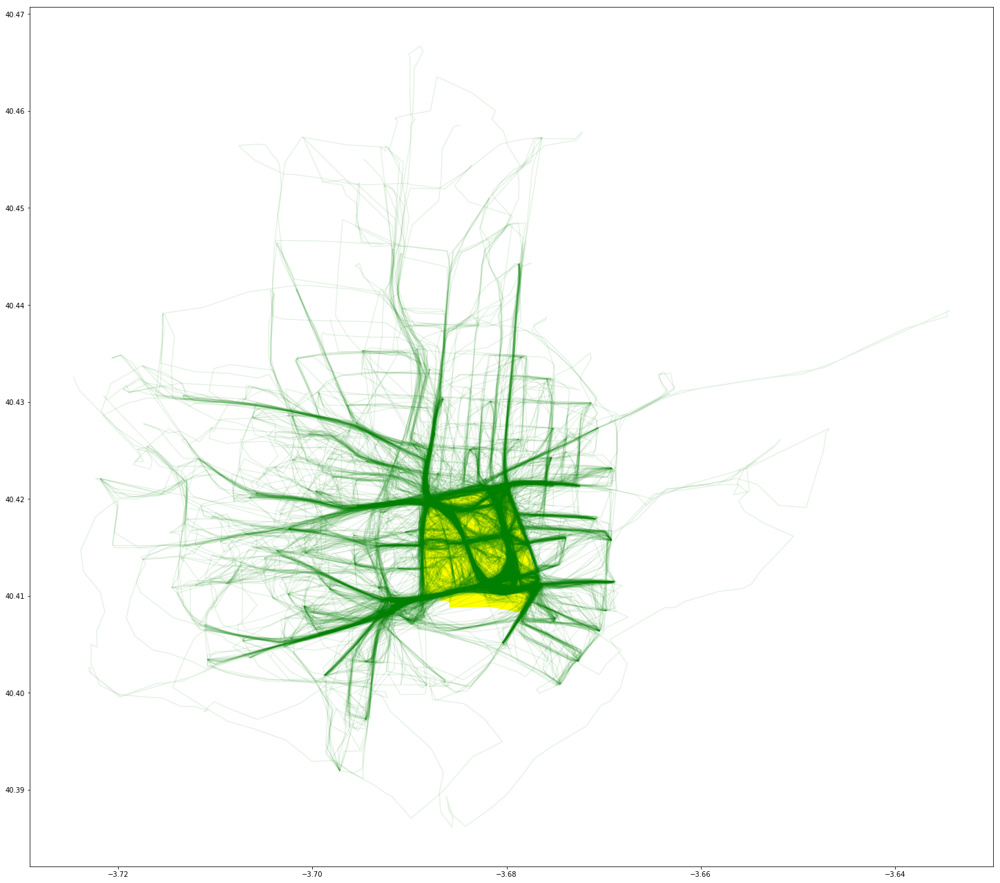

In [51]:
ax=retiro.plot(figsize=[25,25], color='yellow', alpha=1)
#add_basemap(ax, zoom=10)
pointsInRetiro.plot(ax=ax, color='green', alpha=0.1)
#pointsNotInRetiro.plot(ax=ax, color='red', alpha=0.1)

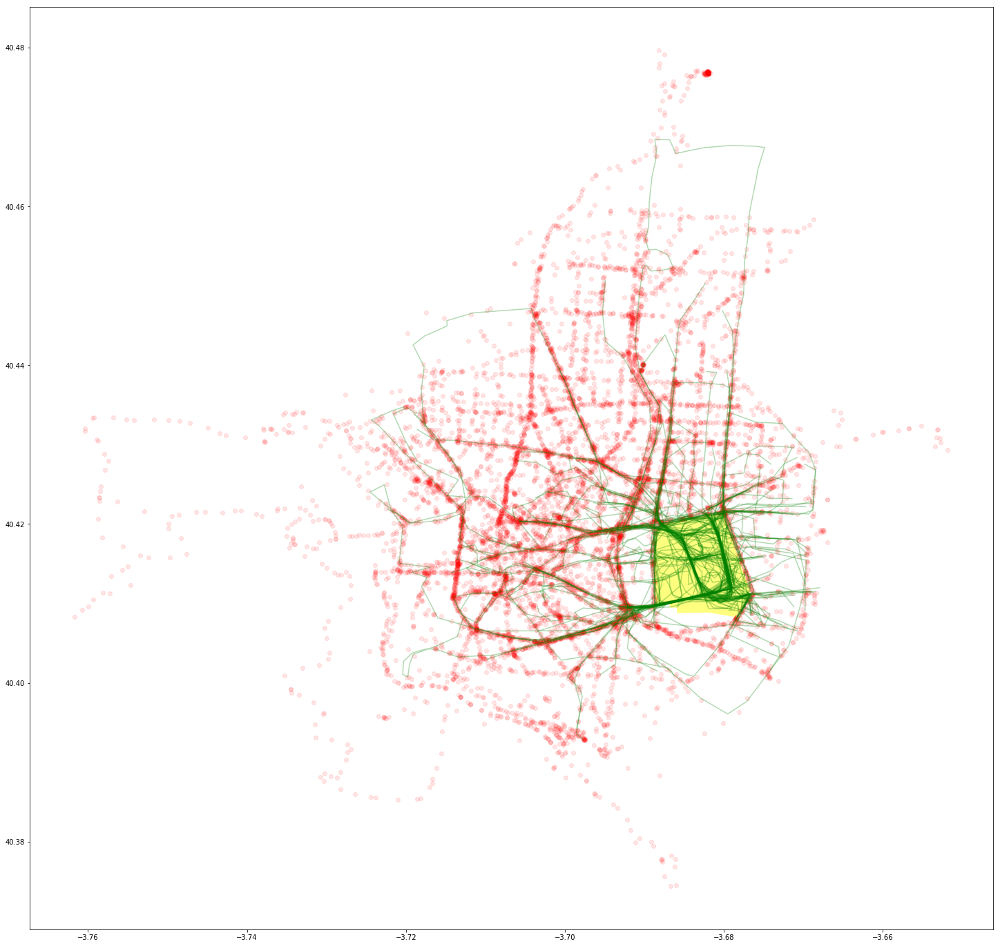

In [256]:
ax=retiro.plot(figsize=[25,25], color='yellow', alpha=0.5)
pointsInRetiro.plot(ax=ax, color='green', alpha=0.3)
pointsNotInRetiro.plot(ax=ax, color='red', alpha=0.1)

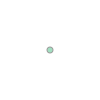

In [444]:
retiro.representative_point()

**<span style="color:red">Esta aquí la prueba con samples</span>**
***



### Mostrar basemap (tiles) con Cartopy ...

In [24]:
import cartopy.crs as ccrs

In [25]:
import cartopy.io.img_tiles as cimgt

In [109]:
gpd.GeoSeries(gpd.GeoSeries(retiro))

TypeError: __init__() got an unexpected keyword argument 'geometry'

### Visualizaciones interactivas

Una muestra de 1000 trayectos que **no** entraron al Retiro :

In [181]:
geo_str = json.dumps(json.load(open('data/narrow_retiro.json', 'r')))

mapa = folium.Map([40.4155068, -3.6840015], zoom_start=15)

mapa.add_child(folium.features.GeoJson(geo_str))
for p in rides[rides['in_Retiro']==False].sample(1000,random_state=98)['full_track']:
    r=folium.features.GeoJson(mapping(LineString(gpd.GeoDataFrame.from_features(p['features'])['geometry'])))
    r.style_function=lambda x: {'color':'red', 'weight':1, 'opacity':.3}
    mapa.add_child(r)
mapa

Una muestra de 100 trayectos que pasan por dentro del Retiro :

In [414]:
geo_str = json.dumps(json.load(open('data/narrow_retiro.json', 'r')))

mapa = folium.Map([40.4155068, -3.6840015], zoom_start=15)

mapa.add_child(folium.features.GeoJson(geo_str))
for p in rides[rides['in_Retiro']==True].sample(100,random_state=113)['full_track']:
    r=folium.features.GeoJson(mapping(LineString(gpd.GeoDataFrame.from_features(p['features'])['geometry'])))
    r.style_function=lambda x: {'color':'green', 'weight':2, 'opacity':.7}
    mapa.add_child(r)
mapa

KeyError: 'in_Retiro'

This is a great reference to customize **point** visualization (markers)
https://ocefpaf.github.io/python4oceanographers/blog/2015/11/02/icons/

In [187]:
#The rides not passing through Retiro are discarded
outside_Retiro_rides = rides.query('in_Retiro == False') 

In [190]:
#Now let's only keep the rides within Retiro
rides = rides.query('in_Retiro == True') 

In [191]:
rides['in_Retiro'].value_counts()

True    21361
Name: in_Retiro, dtype: int64

In [206]:
#This column isn't useful anymore
rides.drop(columns=['in_Retiro'], inplace=True).reset_index(inplace=True)

KeyError: "labels ['in_Retiro'] not contained in axis"

In [213]:
del(outside_Retiro_rides)

In [210]:
rides

,index,_id,ageRange,full_track,idplug_station,idunplug_station,track,travel_time,unplug_hourTime,user_day_code,user_type,zip_code,shapely_track
0,548,5b6779062f384302541d6b9b,0,"{'type': 'FeatureCollection', 'features': [{'g...",123,87,"{'type': 'FeatureCollection', 'features': [{'g...",1057,2018-08-01 05:00:00+02:00,fbad7cd1b58805711f4d4b0ef1a6cddbd9570164b5045d...,1,None,"LINESTRING (-3.7080733 40.4197429, -3.7083346 ..."
1,564,5b6779062f384302541d6c36,0,"{'type': 'FeatureCollection', 'features': [{'g...",94,123,"{'type': 'FeatureCollection', 'features': [{'g...",5275,2018-08-01 05:00:00+02:00,bcf8a6261bad42244c6f435f0950bb56df0f7222d9ab64...,1,None,"LINESTRING (-3.6697526 40.4084556, -3.66967249..."
2,572,5b6779062f384302541d6bc4,5,"{'type': 'FeatureCollection', 'features': [{'g...",104,128,"{'type': 'FeatureCollection', 'features': [{'g...",625,2018-08-01 06:00:00+02:00,7568c842d0fb98e91e6e73187f6ab0882135cb1607fdd4...,1,28045,"LINESTRING (-3.6784838 40.4082805, -3.6774265 ..."
3,599,5b6779062f384302541d6bea,4,"{'type': 'FeatureCollection', 'features': [{'g...",155,78,"{'type': 'FeatureCollection', 'features': [{'g...",916,2018-08-01 06:00:00+02:00,2c180693a8f6fd40e7270a3f13aca8faad2acfaf6be8d9...,1,28913,"LINESTRING (-3.6901234 40.4074902, -3.69011779..."
4,606,5b6779062f384302541d6bf4,0,"{'type': 'FeatureCollection', 'features': [{'g...",86,102,"{'type': 'FeatureCollection', 'features': [{'g...",399,2018-08-01 06:00:00+02:00,dbcf44f02b7c25952a017de1fbf8f21d7532c911e4f3d2...,1,None,"LINESTRING (-3.688398 40.419752, -3.6847699997..."
5,629,5b6779062f384302541d6c11,5,"{'type': 'FeatureCollection', 'features': [{'g...",56,75,"{'type': 'FeatureCollection', 'features': [{'g...",657,2018-08-01 06:00:00+02:00,dff46323a00c9475cf0c5a375b6bf3392169f1391fe788...,1,28009,"LINESTRING (-3.7088337 40.4112744, -3.7088561 ..."
6,635,5b6779062f384302541d6c1b,5,"{'type': 'FeatureCollection', 'features': [{'g...",86,171,"{'type': 'FeatureCollection', 'features': [{'g...",607,2018-08-01 06:00:00+02:00,ec5cc702f6928845296f9f6572eccaf59e1bd94912c0c5...,1,28006,"LINESTRING (-3.6697526 40.4084556, -3.6706205 ..."
7,642,5b6779062f384302541d6c30,5,"{'type': 'FeatureCollection', 'features': [{'g...",159,79,"{'type': 'FeatureCollection', 'features': [{'g...",1036,2018-08-01 06:00:00+02:00,76e5d43dda336ff9ffa87b0b402cf51b1d5565d1beebed...,1,28007,"LINESTRING (-3.687745 40.424963, -3.6884313 40..."
8,647,5b67790e2f384302541d7271,5,"{'type': 'FeatureCollection', 'features': [{'g...",82,30,"{'type': 'FeatureCollection', 'features': [{'g...",8347,2018-08-01 06:00:00+02:00,20ac7e87686d682b5162bfe9f416eaaa79b85d913bc14c...,1,28007,"LINESTRING (-3.7175115 40.4337036, -3.7174488 ..."
9,649,5b6779062f384302541d6c19,0,"{'type': 'FeatureCollection', 'features': [{'g...",84,74,"{'type': 'FeatureCollection', 'features': [{'g...",314,2018-08-01 07:00:00+02:00,fefe7079caa5283a28354942c6b8fe2f4ad105ef27842d...,1,None,"LINESTRING (-3.7036675 40.4463667, -3.70354079..."


In [2]:
#Esta es la lectura de una versión limpia sólo con los trayectos que pasan por El Retiro
# /!\ Wall time: 5.66 s
%time rides=pd.read_json('data/good/RetiroRidesAugust.json', lines=True, dtype={'zip_code':object}, convert_dates=['unplug_hourTime'])

Wall time: 5.66 s


In [50]:
#JSON I/O process couldn't deal with the timezone. We localize our datetime on the Central European Time.
rides['unplug_hourTime']=pd.Series(pd.DatetimeIndex(rides['unplug_hourTime']).tz_localize('UTC').tz_convert('CET'))

In [51]:
#pandas-dev Issue #21892 doesn't allow to deal with categories as a dtype on read_json, so we make the conversion here
rides[['ageRange','idplug_station','idunplug_station','user_type']]=\
rides[['ageRange','idplug_station','idunplug_station','user_type']].astype('category')

In [53]:
# /!\ Wall time: 30.5 s
rides['track_path'] =\
pd.Series(map(lambda r : LineString(gpd.GeoDataFrame.from_features(r['features'], crs='WGS84')['geometry']),\
              rides['full_track']))

Wall time: 30.5 s


In [70]:
with pd.option_context('display.max_seq_items', None):
    print(rides.idunplug_station.value_counts().index)

CategoricalIndex([ 64,  90,  74,  79,  78,  75,  77,  73,  76,  67,  83,  86,
                   80,  84,  65,  81,  66,  87,  55, 102, 103, 106,  89, 128,
                   53,  72, 113,  71, 166,  46,  91, 129, 114, 108,   1,  88,
                   21,  31, 170,  95, 110,  85, 171, 136,  69,  57,  47,  54,
                  155,  82, 115,  19,  94,   2, 104,  56, 100, 101,  96,  62,
                   52, 133,  44, 112,  38, 126, 135,  92,  30,   9,  33,   3,
                   20,  59,  99, 162, 105, 107,  48,  98,  43,  35,  58, 134,
                  164,  51,  49, 111, 127, 163, 169,  26,   6,  45,  10,  25,
                  130,  50,  18, 167, 175,  93, 157, 165,  32,  11, 131, 154,
                   60, 172,   7, 109,  27,  36, 132, 137, 159,  42, 116, 124,
                   13, 125, 149,   8,  29,  97, 160, 123, 117,   5,   4, 145,
                  141, 148,  41,  28, 139,  12, 161, 158,  63,  34,  16, 143,
                  118,  40, 168, 156, 140, 144, 138, 122,  14, 1

**Estaciones más frecuentes para retirar una bici**

In [72]:
stations.index=stations['id']

In [73]:
top5=rides.idunplug_station.value_counts().sort_values(ascending=False)[:5]

In [74]:
pd.DataFrame(top5).join(stations[['address','name']])

,idunplug_station,address,name
64,938,PLAZA DE LA INDEPENDENCIA 6,Plaza de la Independencia
90,901,AVENIDA DE MENÉNDEZ PELAYO 11,Puerta de Madrid
74,873,AVENIDA DE MENÉNDEZ PELAYO 63,Puerta del Doce de Octubre
79,710,AVENIDA DE MENÉNDEZ PELAYO 90,Menéndez Pelayo
78,706,AVENIDA DE MENÉNDEZ PELAYO 73,Puerta del Pacífico


#### Plotting all rides passing through El Retiro

In [54]:
gpd.GeoSeries.plot

<function geopandas.geoseries.GeoSeries.plot(self, *args, **kwargs)>

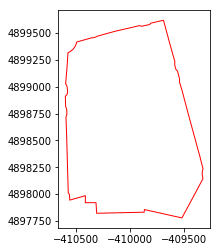

In [56]:
retiro_projection = gpd.GeoSeries(retiro)
retiro_projection.crs = {'init' :'epsg:4326'}
retiro_projection.to_crs(epsg=3395).plot(linestyle='-', edgecolor='red', facecolor='none')

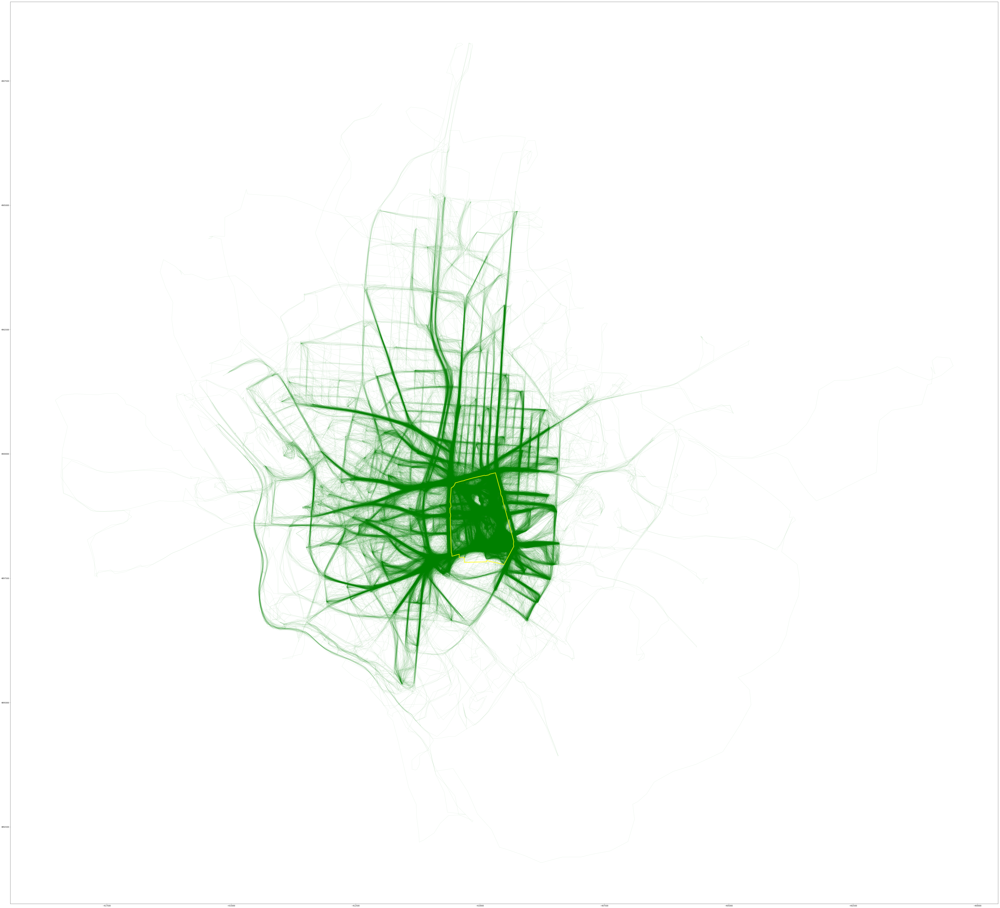

In [277]:
plottable=gpd.GeoSeries(rides['track_path'])
plottable.crs = {'init' :'epsg:4326'}
ax = plottable.to_crs(epsg=3395).plot(figsize=(100,100), color='green', alpha=.3, linewidth=.4, zorder=1)
retiro_projection.to_crs(epsg=3395).plot(ax=ax, linestyle='-', linewidth=4, edgecolor='yellow', facecolor='none', alpha=.8, zorder=2)


#### Travel time in Retiro rides

Sobre el total de rides de agosto:
time_travel
```
count	208350
mean	979.998435
std	1246.950072
min	23
25%	461
50%	681
75%	1017
max	21598```

In [279]:
#Los trayectos que pasan por el Retiro tienden a ser más largos (tiempo en segundos)
rides['travel_time'].describe()

count    21361.000000
mean      1485.749918
std       1747.730612
min        150.000000
25%        662.000000
50%        919.000000
75%       1421.000000
max      21132.000000
Name: travel_time, dtype: float64

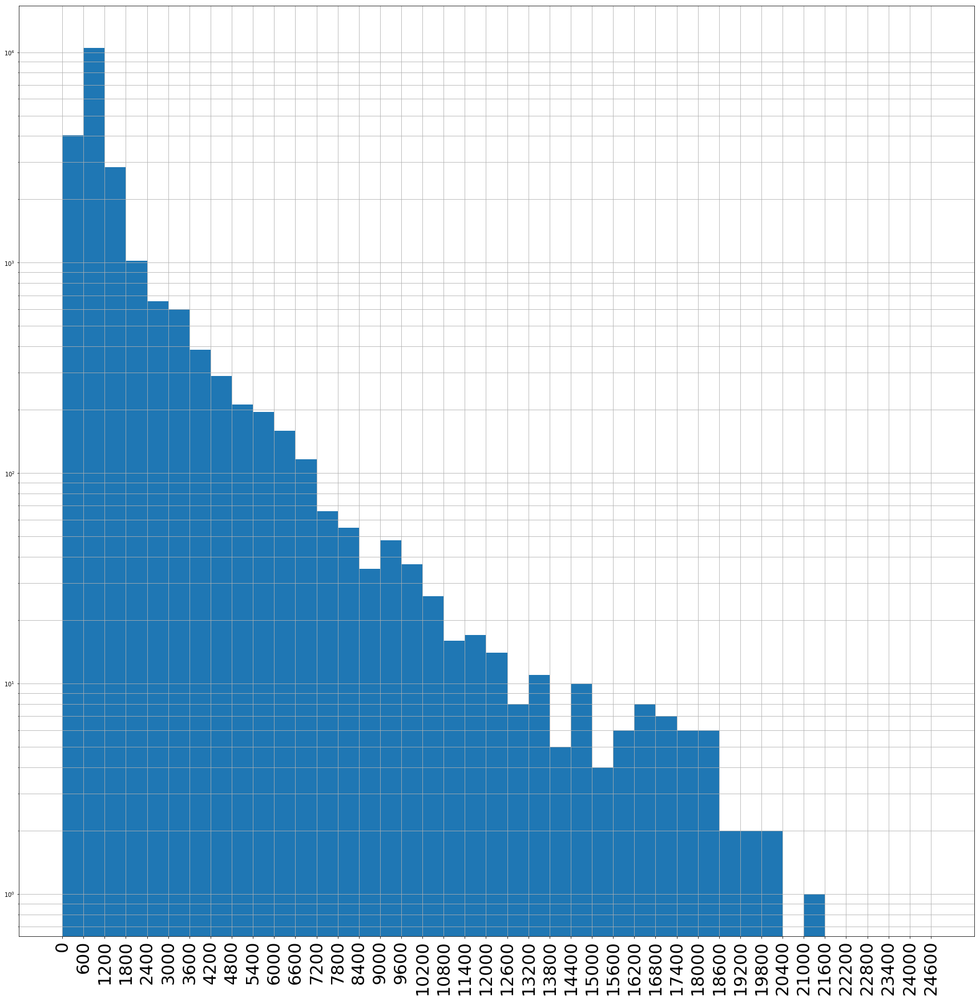

In [291]:
fig, ax = plt.subplots(figsize=(30,30))
rides['travel_time'].hist(ax=ax, bins=np.arange(0, 25000, 600))
ax.set_yscale('log')
ax.set_xticks(np.arange(0, 25000, 600))
ax.grid(which='minor')
ax.set_xticklabels(np.arange(0, 25000, 600), rotation=90, fontsize=30)
#ax.set_yticklabels(_, rotation=0, fontsize=30)
_ = plt.plot()

In [292]:
rides.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21361 entries, 0 to 21360
Data columns (total 13 columns):
index               21361 non-null int64
_id                 21361 non-null object
ageRange            21361 non-null category
full_track          21361 non-null object
idplug_station      21361 non-null category
idunplug_station    21361 non-null category
track               21361 non-null object
travel_time         21361 non-null int64
unplug_hourTime     21361 non-null datetime64[ns, CET]
user_day_code       21361 non-null object
user_type           21361 non-null category
zip_code            13046 non-null object
shapely_track       21361 non-null object
dtypes: category(4), datetime64[ns, CET](1), int64(2), object(6)
memory usage: 1.6+ MB


#### Users having multiple rides in a day

In [102]:
#Wall time: 6.98 ms
rides['has_multiple_rides'] = rides['user_day_code'].duplicated(keep=False)

In [103]:
#Around 43% of the rides aren't the only daily ride of the user
print('Count:\n',rides['has_multiple_rides'].value_counts())
print('Proportion:\n',rides['has_multiple_rides'].value_counts(normalize=True))

Count:
 False    12229
True      9132
Name: has_multiple_rides, dtype: int64
Proportion:
 False    0.572492
True     0.427508
Name: has_multiple_rides, dtype: float64


In [104]:
#Let's take a look. Indeed every ride under the same "user_day_code" belongs to the same day.
rides[rides['has_multiple_rides']][['unplug_hourTime', 'travel_time', 'idunplug_station', 'idplug_station','user_day_code']].sort_values('user_day_code')

,unplug_hourTime,travel_time,idunplug_station,idplug_station,user_day_code
11333,2018-08-16 13:00:00+02:00,2489,86,73,003809733da1d00eb9671d8be40aaa601af273f4c0c184...
11710,2018-08-16 20:00:00+02:00,3698,1,73,003809733da1d00eb9671d8be40aaa601af273f4c0c184...
28,2018-08-01 07:00:00+02:00,627,86,64,004d771eb26866691d395b063b80379cc0206bacbb3939...
607,2018-08-01 15:00:00+02:00,664,91,86,004d771eb26866691d395b063b80379cc0206bacbb3939...
13946,2018-08-20 14:00:00+02:00,949,163,89,00533937b93f9f0dcdc5cb4639665b1be5f09fba63a521...
14198,2018-08-20 18:00:00+02:00,810,83,58,00533937b93f9f0dcdc5cb4639665b1be5f09fba63a521...
13741,2018-08-20 09:00:00+02:00,1045,89,163,00533937b93f9f0dcdc5cb4639665b1be5f09fba63a521...
1830,2018-08-02 17:00:00+02:00,737,6,80,005cab8e98611cfa4baac6b1e8d189e427a6cb90ad64b4...
1518,2018-08-02 12:00:00+02:00,923,80,6,005cab8e98611cfa4baac6b1e8d189e427a6cb90ad64b4...
10125,2018-08-14 15:00:00+02:00,562,93,75,00621c1626e47ea53dffe464fede0caeb04a407f20faec...


In [105]:
#Grouping the multiple daily rides
multiple_rides_count = rides[rides['has_multiple_rides']].\
groupby('user_day_code').\
size()
multiple_rides_count.name='multiple_rides_cluster_size'
multiple_rides_count

user_day_code
003809733da1d00eb9671d8be40aaa601af273f4c0c184ea758ec329510c56e3    2
004d771eb26866691d395b063b80379cc0206bacbb3939eb77446374801ae4d0    2
00533937b93f9f0dcdc5cb4639665b1be5f09fba63a521e03cbfe785657cf96d    3
005cab8e98611cfa4baac6b1e8d189e427a6cb90ad64b4275ee029fe5968abc5    2
00621c1626e47ea53dffe464fede0caeb04a407f20faec26296c17563f2ca9f4    2
0075403f0b28e2904cde5cec200844c03bea29ae164878b2f03eb1ba6727b36c    2
00755e0bd1232d90a581bc0290023c61d85fb3bb7452fc8536b59630867f6e05    2
00901118aa2ad502d9c485bd66e1d79c52d1146b4d094a3cca88422dab386552    2
00aaa572d8f26b741bd328bc3fc8cb8ca5086b4632361212fa6b1e2cb488a6ae    2
00af17ebceb47fdbdfbe599c1e547230de87d9e8ea45e4cf003f50939433f7fb    2
00b6ddf640c5fd1c4dd43847a8b3656bbfa11c1fb3c6594d58988ac1bb1d399c    2
00c5db7b6a53508067ca9acf7a1fedee69fe63dda70ee4f09c98116a7c45b19d    2
00c9c578c2a1eb9ba8312f6c2b1e3ac2a719c23a03cc89747472693b003024a1    2
00d77bd9477c8598031b91f54658c3dc5ce2c515e1fdf81d11980a7763946c29    2
00dae9

In [81]:
#There are two people with 6 rides each in a single day!
#But the most interesting pattern is so many people having 2 rides a day...
#Round trip to work? Transfer to another bike in order to not exceed 30 minutes (reduced fare)?

multiple_rides_count.value_counts()

2    3775
3     349
4     122
5       7
6       2
dtype: int64

In [455]:
multiple_rides_count[multiple_rides_count == 6]

user_day_code
19131f6e7e1ea47380a170468f8d64ca3e25ee5e18e2e03e388f61ccd2496ab7    6
91f5da1bbbdfc4777a8e142672d0e6a9d8d8fa532827df7c2f2c7a6c73d35542    6
dtype: int64

In [141]:
rides[rides['user_day_code']=='19131f6e7e1ea47380a170468f8d64ca3e25ee5e18e2e03e388f61ccd2496ab7']

,_id,ageRange,full_track,idplug_station,idunplug_station,track,travel_time,unplug_hourTime,user_day_code,user_type,zip_code,shapely_track,has_multiple_rides
18729,5b886ee72f38435898bdb37c,0,"{'type': 'FeatureCollection', 'features': [{'g...",74,31,"{'type': 'FeatureCollection', 'features': [{'g...",583,2018-08-26 08:00:00+02:00,19131f6e7e1ea47380a170468f8d64ca3e25ee5e18e2e0...,1,None,"LINESTRING (-3.6779232 40.4153053, -3.6778126 ...",True
18740,5b886ee72f38435898bdb40c,0,"{'type': 'FeatureCollection', 'features': [{'g...",31,74,"{'type': 'FeatureCollection', 'features': [{'g...",435,2018-08-26 09:00:00+02:00,19131f6e7e1ea47380a170468f8d64ca3e25ee5e18e2e0...,1,None,"LINESTRING (-3.6956178 40.4132798, -3.6954606 ...",True
18928,5b886ef42f38435898bdbdd4,0,"{'type': 'FeatureCollection', 'features': [{'g...",74,31,"{'type': 'FeatureCollection', 'features': [{'g...",375,2018-08-26 15:00:00+02:00,19131f6e7e1ea47380a170468f8d64ca3e25ee5e18e2e0...,1,None,"LINESTRING (-3.6779232 40.4153053, -3.67993499...",True
19065,5b886efe2f38435898bdc59c,0,"{'type': 'FeatureCollection', 'features': [{'g...",31,74,"{'type': 'FeatureCollection', 'features': [{'g...",751,2018-08-26 19:00:00+02:00,19131f6e7e1ea47380a170468f8d64ca3e25ee5e18e2e0...,1,None,"LINESTRING (-3.6956178 40.4132798, -3.69527509...",True
19175,5b886f032f38435898bdc9ab,0,"{'type': 'FeatureCollection', 'features': [{'g...",74,31,"{'type': 'FeatureCollection', 'features': [{'g...",603,2018-08-26 21:00:00+02:00,19131f6e7e1ea47380a170468f8d64ca3e25ee5e18e2e0...,1,None,"LINESTRING (-3.6779232 40.4153053, -3.6778743 ...",True
19183,5b886f052f38435898bdcac2,0,"{'type': 'FeatureCollection', 'features': [{'g...",31,74,"{'type': 'FeatureCollection', 'features': [{'g...",462,2018-08-26 21:00:00+02:00,19131f6e7e1ea47380a170468f8d64ca3e25ee5e18e2e0...,1,None,"LINESTRING (-3.6956178 40.4132798, -3.6950628 ...",True


In [109]:
#August 26th this user made the same round trip 3 times with 3 different bikes in the morning, in the afternoon and in the evening.
mapa = folium.Map([40.4155068, -3.6840015], zoom_start=15)
for p in rides[rides['user_day_code']=='19131f6e7e1ea47380a170468f8d64ca3e25ee5e18e2e03e388f61ccd2496ab7']['track_path']:
    r=folium.features.GeoJson(mapping(p))
    r.style_function=lambda x: {'color':'green', 'weight':2, 'opacity':.7}
    mapa.add_child(r)
mapa

In [398]:
stations[stations['id']==64]

,activate,address,dock_bikes,free_bases,id,latitude,light,longitude,name,no_available,number,reservations_count,total_bases
62,1,Plaza de la Independencia nº 6,0,23,64,40.419752,0,-3.688398,Plaza de la Independencia,0,60,0,24


In [142]:
#New feature: how many rides that day, including itself 
rides.join(multiple_rides_count, on='user_day_code')[['has_multiple_rides','multiple_rides_cluster_size']]

,has_multiple_rides,multiple_rides_cluster_size
0,False,NaN
1,False,NaN
2,False,NaN
3,False,NaN
4,False,NaN
5,False,NaN
6,True,2.0
7,False,NaN
8,True,2.0
9,True,2.0


In [143]:
len(rides)

21361

In [144]:
#Sanity check before making it: no loss of rows after the join
len(rides.join(multiple_rides_count, on='user_day_code')['multiple_rides_cluster_size'])

21361

In [145]:
rides = rides.join(multiple_rides_count, on='user_day_code')

In [146]:
rides['multiple_rides_cluster_size'].value_counts(dropna=False)
#The NaN must be the rest of "single rides" (the only ride of the user that day):

NaN     12229
 2.0     7550
 3.0     1047
 4.0      488
 5.0       35
 6.0       12
Name: multiple_rides_cluster_size, dtype: int64

In [147]:
#Filling the NA
rides['multiple_rides_cluster_size'].fillna(1, inplace=True)
rides['multiple_rides_cluster_size'].value_counts(dropna=False)

1.0    12229
2.0     7550
3.0     1047
4.0      488
5.0       35
6.0       12
Name: multiple_rides_cluster_size, dtype: int64

In [149]:
#Float to Integer
rides['multiple_rides_cluster_size']=\
rides['multiple_rides_cluster_size'].astype(np.int64)

In [150]:
rides['multiple_rides_cluster_size'].value_counts(dropna=False)

1    12229
2     7550
3     1047
4      488
5       35
6       12
Name: multiple_rides_cluster_size, dtype: int64

#### Identificar días festivos y fines de semana

In [157]:
from datetime import datetime

In [161]:
#Prueba: Extraer el día de la semana (0 domingo, 6 sábado)
pd.Series(map(lambda w : w.strftime('%w'), rides['unplug_hourTime']))

0        3
1        3
2        3
3        3
4        3
5        3
6        3
7        3
8        3
9        3
10       3
11       3
12       3
13       3
14       3
15       3
16       3
17       3
18       3
19       3
20       3
21       3
22       3
23       3
24       3
25       3
26       3
27       3
28       3
29       3
        ..
21331    2
21332    2
21333    2
21334    2
21335    2
21336    2
21337    2
21338    2
21339    2
21340    2
21341    2
21342    2
21343    2
21344    2
21345    2
21346    2
21347    2
21348    2
21349    2
21350    2
21351    2
21352    2
21353    2
21354    2
21355    2
21356    2
21357    2
21358    2
21359    2
21360    2
Length: 21361, dtype: object

In [ ]:
pd.Timestamp.

In [221]:
pd.to_datetime('2018-08-15 05:00:00+02:00').normalize()

Timestamp('2018-08-15 00:00:00')

In [237]:
#We are considering Saturdays, Sundays and Public Holidays as "days off"
def is_day_off(date):
    #Weekday
    wd = date.strftime('%w')
    #Public Holidays
    ph = [pd.to_datetime('2018-Aug-15')]
    #If it's saturday or sunday... or if the date at midnight and timezone-naive is a public holiday
    if (wd in ['6','0']) or (date.tz_localize(None).normalize() in ph):
        return True
    else:
        return False

In [238]:
is_day_off(pd.to_datetime('2018-08-15 05:00:00+02:00'))

True

In [248]:
rides['is_day_off'] = pd.Series(map(lambda d : is_day_off(d), rides['unplug_hourTime']))

In [257]:
#Test improvisado justo antes de comenzar un sábado y después de acabar el 15 de agosto (festivo)
rides[(rides['unplug_hourTime'] >= '2018-08-10 23:00:00') & \
      (rides['unplug_hourTime'] <= '2018-08-16 03:00:00')][['unplug_hourTime', 'is_day_off']]

,unplug_hourTime,is_day_off
8031,2018-08-10 23:00:00+02:00,False
8032,2018-08-10 23:00:00+02:00,False
8033,2018-08-10 23:00:00+02:00,False
8034,2018-08-10 23:00:00+02:00,False
8035,2018-08-10 23:00:00+02:00,False
8036,2018-08-10 23:00:00+02:00,False
8037,2018-08-10 23:00:00+02:00,False
8038,2018-08-10 23:00:00+02:00,False
8039,2018-08-10 23:00:00+02:00,False
8040,2018-08-10 23:00:00+02:00,False


#### Cambio de índice

In [262]:
rides.head()

,_id,ageRange,full_track,idplug_station,idunplug_station,track,travel_time,unplug_hourTime,user_day_code,user_type,zip_code,shapely_track,has_multiple_rides,multiple_rides_cluster_size,is_day_off
unplug_hourTime,,,,,,,,,,,,,,,
2018-08-01 05:00:00+02:00,5b6779062f384302541d6b9b,0,"{'type': 'FeatureCollection', 'features': [{'g...",123,87,"{'type': 'FeatureCollection', 'features': [{'g...",1057,2018-08-01 05:00:00+02:00,fbad7cd1b58805711f4d4b0ef1a6cddbd9570164b5045d...,1,None,"LINESTRING (-3.711603 40.42402, -3.7101631 40....",False,1,False
2018-08-01 05:00:00+02:00,5b6779062f384302541d6c36,0,"{'type': 'FeatureCollection', 'features': [{'g...",94,123,"{'type': 'FeatureCollection', 'features': [{'g...",5275,2018-08-01 05:00:00+02:00,bcf8a6261bad42244c6f435f0950bb56df0f7222d9ab64...,1,None,"LINESTRING (-3.6752024 40.4272582, -3.67560179...",False,1,False
2018-08-01 06:00:00+02:00,5b6779062f384302541d6bc4,5,"{'type': 'FeatureCollection', 'features': [{'g...",104,128,"{'type': 'FeatureCollection', 'features': [{'g...",625,2018-08-01 06:00:00+02:00,7568c842d0fb98e91e6e73187f6ab0882135cb1607fdd4...,1,28045,"LINESTRING (-3.6738714 40.4261851, -3.67690409...",False,1,False
2018-08-01 06:00:00+02:00,5b6779062f384302541d6bea,4,"{'type': 'FeatureCollection', 'features': [{'g...",155,78,"{'type': 'FeatureCollection', 'features': [{'g...",916,2018-08-01 06:00:00+02:00,2c180693a8f6fd40e7270a3f13aca8faad2acfaf6be8d9...,1,28913,"LINESTRING (-3.6787169 40.4442258, -3.6786126 ...",False,1,False
2018-08-01 06:00:00+02:00,5b6779062f384302541d6bf4,0,"{'type': 'FeatureCollection', 'features': [{'g...",86,102,"{'type': 'FeatureCollection', 'features': [{'g...",399,2018-08-01 06:00:00+02:00,dbcf44f02b7c25952a017de1fbf8f21d7532c911e4f3d2...,1,None,"LINESTRING (-3.691987 40.409297, -3.6898404997...",False,1,False


#### Distancia de las estaciones origen y destino al parque

Calculamos la distancia geodésica de cada estación al parque para enriquecer la información de los trayectos, dando una interpretación numérica a estas variables categóricas.

In [605]:
#Facilitamos el join posterior indexando por id de estación
stations.index=stations.id
stations.index

Int64Index([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,
            ...
            138, 173, 172, 132, 133, 134, 136, 135, 174, 175],
           dtype='int64', name='id', length=172)

In [625]:
#This function returns the distance between a point and the nearest point of Retiro Park
#Geodesic distance in meters is determined using Haversine formula (https://en.wikipedia.org/wiki/Haversine_formula)

def meters_to_Retiro(coords):
    #Getting the nearest point of Retiro Park from the origin (coords)
    #/!\ nearest_points is a Shapely function so it admits points on a x,y format (long,lat)
    pair=nearest_points(retiro,Point(coords[1], coords[0]))
    #/!\ haversine admits points on a y,x format (lat,long) and returns distance in km
    distance=haversine.haversine((pair[0].y,pair[0].x), (pair[1].y,pair[1].x))
    return distance*1000


In [632]:
stations['to_Retiro'] = stations[['latitude', 'longitude']].apply(meters_to_Retiro, axis=1)

In [635]:
stations[stations['to_Retiro']<100].sort_values('to_Retiro')
#Como es lógico, las estaciones que están a menos de 100 metros del perímetro se encuentran en las calles circundantes.

,address,id,latitude,longitude,name,number,to_Retiro
id,,,,,,,
78,AVENIDA DE MENÉNDEZ PELAYO 73,78,40.4117627,-3.6766813,Puerta del Pacífico,74,28.7956614
74,AVENIDA DE MENÉNDEZ PELAYO 63,74,40.4153053,-3.6779232,Puerta del Doce de Octubre,70,29.2222335
79,AVENIDA DE MENÉNDEZ PELAYO 90,79,40.4082805,-3.6784838,Menéndez Pelayo,75,32.0577925
90,AVENIDA DE MENÉNDEZ PELAYO 11,90,40.4215010,-3.6800080,Puerta de Madrid,85,46.9439677
73,AVENIDA DE ALFONSO XII 54,73,40.4098080,-3.6888220,Puerta del Ángel Caído,69,56.3019280
64,PLAZA DE LA INDEPENDENCIA 6,64,40.4197520,-3.6883980,Plaza de la Independencia,60,71.4404537
107,CALLE ALCALÁ 95,107,40.4211802,-3.6840229,Velázquez,102,75.0494756


In [638]:
stations.sort_values('to_Retiro', ascending=False).head(5)
#Y las 5 más lejanas, a más de 4 km, están en la zona norte de la ciudad

,address,id,latitude,longitude,name,number,to_Retiro
id,,,,,,,
140,CALLE SOR ÁNGELA DE LA CRUZ 2,140,40.4592351,-3.6915330,Sor Ángela de la Cruz,156,4356.5915106
139,CALLE DEL GENERAL YAGÜE 57,139,40.4572824,-3.7009675,San Germán,155,4325.3801378
137,PASEO DE LA CASTELLANA 164,137,40.4591366,-3.6894151,Castellana 164,157,4306.6236060
138,AVENIDA DE ALBERTO ALCOCER 22,138,40.4585318,-3.6847150,Alberto Alcocer,158,4174.6938394
172,CALLE COLOMBIA 7,172,40.4572466,-3.6763439,Colombia,160,4028.8713142


Añadir esta información a los trayectos como dos nuevas variables:

In [657]:
stations.index = pd.CategoricalIndex(stations.index)

In [659]:
stations.info()

<class 'pandas.core.frame.DataFrame'>
CategoricalIndex: 172 entries, 1 to 175
Data columns (total 7 columns):
address      172 non-null object
id           172 non-null category
latitude     172 non-null float64
longitude    172 non-null float64
name         172 non-null object
number       172 non-null object
to_Retiro    172 non-null float64
dtypes: category(1), float64(3), object(3)
memory usage: 21.4+ KB


In [660]:
stations['id']=\
stations['id'].astype('category')
stations.dtypes

address        object
id           category
latitude      float64
longitude     float64
name           object
number         object
to_Retiro     float64
dtype: object

In [670]:
len(rides)

21361

In [671]:
#Sanity check before making it: no loss of rows after the join
len(rides.join(stations['to_Retiro'].rename('orig_to_Retiro'), on='idunplug_station'))

21361

In [672]:
rides = rides.join(stations['to_Retiro'].rename('orig_to_Retiro'), on='idunplug_station')
rides
#Aquí tenemos la nueva columna orig_to_Retiro

,_id,ageRange,full_track,idplug_station,idunplug_station,track,travel_time,unplug_hourTime,user_day_code,user_type,zip_code,shapely_track,has_multiple_rides,multiple_rides_cluster_size,is_day_off,orig_to_Retiro
unplug_hourTime,,,,,,,,,,,,,,,,
2018-08-01 05:00:00+02:00,5b6779062f384302541d6b9b,0,"{'type': 'FeatureCollection', 'features': [{'g...",123,87,"{'type': 'FeatureCollection', 'features': [{'g...",1057,2018-08-01 05:00:00+02:00,fbad7cd1b58805711f4d4b0ef1a6cddbd9570164b5045d...,1,None,"LINESTRING (-3.711603 40.42402, -3.7101631 40....",False,1,False,674.5601362
2018-08-01 05:00:00+02:00,5b6779062f384302541d6c36,0,"{'type': 'FeatureCollection', 'features': [{'g...",94,123,"{'type': 'FeatureCollection', 'features': [{'g...",5275,2018-08-01 05:00:00+02:00,bcf8a6261bad42244c6f435f0950bb56df0f7222d9ab64...,1,None,"LINESTRING (-3.6752024 40.4272582, -3.67560179...",False,1,False,2048.9228192
2018-08-01 06:00:00+02:00,5b6779062f384302541d6bc4,5,"{'type': 'FeatureCollection', 'features': [{'g...",104,128,"{'type': 'FeatureCollection', 'features': [{'g...",625,2018-08-01 06:00:00+02:00,7568c842d0fb98e91e6e73187f6ab0882135cb1607fdd4...,1,28045,"LINESTRING (-3.6738714 40.4261851, -3.67690409...",False,1,False,891.2882798
2018-08-01 06:00:00+02:00,5b6779062f384302541d6bea,4,"{'type': 'FeatureCollection', 'features': [{'g...",155,78,"{'type': 'FeatureCollection', 'features': [{'g...",916,2018-08-01 06:00:00+02:00,2c180693a8f6fd40e7270a3f13aca8faad2acfaf6be8d9...,1,28913,"LINESTRING (-3.6787169 40.4442258, -3.6786126 ...",False,1,False,28.7956614
2018-08-01 06:00:00+02:00,5b6779062f384302541d6bf4,0,"{'type': 'FeatureCollection', 'features': [{'g...",86,102,"{'type': 'FeatureCollection', 'features': [{'g...",399,2018-08-01 06:00:00+02:00,dbcf44f02b7c25952a017de1fbf8f21d7532c911e4f3d2...,1,None,"LINESTRING (-3.691987 40.409297, -3.6898404997...",False,1,False,173.0740571
2018-08-01 06:00:00+02:00,5b6779062f384302541d6c11,5,"{'type': 'FeatureCollection', 'features': [{'g...",56,75,"{'type': 'FeatureCollection', 'features': [{'g...",657,2018-08-01 06:00:00+02:00,dff46323a00c9475cf0c5a375b6bf3392169f1391fe788...,1,28009,"LINESTRING (-3.7007164 40.4144226, -3.7003455 ...",False,1,False,383.6576370
2018-08-01 06:00:00+02:00,5b6779062f384302541d6c1b,5,"{'type': 'FeatureCollection', 'features': [{'g...",86,171,"{'type': 'FeatureCollection', 'features': [{'g...",607,2018-08-01 06:00:00+02:00,ec5cc702f6928845296f9f6572eccaf59e1bd94912c0c5...,1,28006,"LINESTRING (-3.691987 40.409297, -3.6898553 40...",True,2,False,1236.1302809
2018-08-01 06:00:00+02:00,5b6779062f384302541d6c30,5,"{'type': 'FeatureCollection', 'features': [{'g...",159,79,"{'type': 'FeatureCollection', 'features': [{'g...",1036,2018-08-01 06:00:00+02:00,76e5d43dda336ff9ffa87b0b402cf51b1d5565d1beebed...,1,28007,"LINESTRING (-3.6907784 40.4396792, -3.6900488 ...",False,1,False,32.0577925
2018-08-01 06:00:00+02:00,5b67790e2f384302541d7271,5,"{'type': 'FeatureCollection', 'features': [{'g...",82,30,"{'type': 'FeatureCollection', 'features': [{'g...",8347,2018-08-01 06:00:00+02:00,20ac7e87686d682b5162bfe9f416eaaa79b85d913bc14c...,1,28007,"LINESTRING (-3.6744804 40.4009101, -3.66950829...",True,2,False,747.1017909


In [673]:
#Mismo tratamiento sobre la estación de destino
rides = rides.join(stations['to_Retiro'].rename('dest_to_Retiro'), on='idplug_station')
rides

,_id,ageRange,full_track,idplug_station,idunplug_station,track,travel_time,unplug_hourTime,user_day_code,user_type,zip_code,shapely_track,has_multiple_rides,multiple_rides_cluster_size,is_day_off,orig_to_Retiro,dest_to_Retiro
unplug_hourTime,,,,,,,,,,,,,,,,,
2018-08-01 05:00:00+02:00,5b6779062f384302541d6b9b,0,"{'type': 'FeatureCollection', 'features': [{'g...",123,87,"{'type': 'FeatureCollection', 'features': [{'g...",1057,2018-08-01 05:00:00+02:00,fbad7cd1b58805711f4d4b0ef1a6cddbd9570164b5045d...,1,None,"LINESTRING (-3.711603 40.42402, -3.7101631 40....",False,1,False,674.5601362,2048.9228192
2018-08-01 05:00:00+02:00,5b6779062f384302541d6c36,0,"{'type': 'FeatureCollection', 'features': [{'g...",94,123,"{'type': 'FeatureCollection', 'features': [{'g...",5275,2018-08-01 05:00:00+02:00,bcf8a6261bad42244c6f435f0950bb56df0f7222d9ab64...,1,None,"LINESTRING (-3.6752024 40.4272582, -3.67560179...",False,1,False,2048.9228192,805.4129211
2018-08-01 06:00:00+02:00,5b6779062f384302541d6bc4,5,"{'type': 'FeatureCollection', 'features': [{'g...",104,128,"{'type': 'FeatureCollection', 'features': [{'g...",625,2018-08-01 06:00:00+02:00,7568c842d0fb98e91e6e73187f6ab0882135cb1607fdd4...,1,28045,"LINESTRING (-3.6738714 40.4261851, -3.67690409...",False,1,False,891.2882798,781.2524454
2018-08-01 06:00:00+02:00,5b6779062f384302541d6bea,4,"{'type': 'FeatureCollection', 'features': [{'g...",155,78,"{'type': 'FeatureCollection', 'features': [{'g...",916,2018-08-01 06:00:00+02:00,2c180693a8f6fd40e7270a3f13aca8faad2acfaf6be8d9...,1,28913,"LINESTRING (-3.6787169 40.4442258, -3.6786126 ...",False,1,False,28.7956614,2570.5987224
2018-08-01 06:00:00+02:00,5b6779062f384302541d6bf4,0,"{'type': 'FeatureCollection', 'features': [{'g...",86,102,"{'type': 'FeatureCollection', 'features': [{'g...",399,2018-08-01 06:00:00+02:00,dbcf44f02b7c25952a017de1fbf8f21d7532c911e4f3d2...,1,None,"LINESTRING (-3.691987 40.409297, -3.6898404997...",False,1,False,173.0740571,326.8594535
2018-08-01 06:00:00+02:00,5b6779062f384302541d6c11,5,"{'type': 'FeatureCollection', 'features': [{'g...",56,75,"{'type': 'FeatureCollection', 'features': [{'g...",657,2018-08-01 06:00:00+02:00,dff46323a00c9475cf0c5a375b6bf3392169f1391fe788...,1,28009,"LINESTRING (-3.7007164 40.4144226, -3.7003455 ...",False,1,False,383.6576370,1038.9932074
2018-08-01 06:00:00+02:00,5b6779062f384302541d6c1b,5,"{'type': 'FeatureCollection', 'features': [{'g...",86,171,"{'type': 'FeatureCollection', 'features': [{'g...",607,2018-08-01 06:00:00+02:00,ec5cc702f6928845296f9f6572eccaf59e1bd94912c0c5...,1,28006,"LINESTRING (-3.691987 40.409297, -3.6898553 40...",True,2,False,1236.1302809,326.8594535
2018-08-01 06:00:00+02:00,5b6779062f384302541d6c30,5,"{'type': 'FeatureCollection', 'features': [{'g...",159,79,"{'type': 'FeatureCollection', 'features': [{'g...",1036,2018-08-01 06:00:00+02:00,76e5d43dda336ff9ffa87b0b402cf51b1d5565d1beebed...,1,28007,"LINESTRING (-3.6907784 40.4396792, -3.6900488 ...",False,1,False,32.0577925,2221.1736432
2018-08-01 06:00:00+02:00,5b67790e2f384302541d7271,5,"{'type': 'FeatureCollection', 'features': [{'g...",82,30,"{'type': 'FeatureCollection', 'features': [{'g...",8347,2018-08-01 06:00:00+02:00,20ac7e87686d682b5162bfe9f416eaaa79b85d913bc14c...,1,28007,"LINESTRING (-3.6744804 40.4009101, -3.66950829...",True,2,False,747.1017909,916.5817190


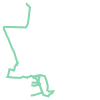

In [696]:
#Desde Cuzco sobre las 22h un domingo, bajando por Chamberí y Chueca, luego paseo a medianoche por el parque y
#hasta la cuesta de Moyano.
rides[rides['_id']=='5b774b5d2f384367d890f782']['track_path'][0]

Comparativa de una muestra de 100 trayectos que pasaron por el Retiro pero comenzaron <font color='blue'>a más de 4kms</font> y otros tantos que lo hicieron <font color='red'>a menos de 100 metros</font>. Tooltip: duración del trayecto.

In [756]:
mapa = folium.Map([40.42635248336305, -3.689088821411133], zoom_start=12, tiles='stamentoner')
for i,p in rides[(rides.orig_to_Retiro>4000)].sample(100).iterrows():
    r=folium.features.GeoJson(mapping(p.track_path), tooltip="Far start. Ride duration: "+str(pd.Timedelta(p.travel_time, unit='s')))
    r.style_function=lambda x: {'color':'blue', 'weight':2, 'opacity':.2}
    mapa.add_child(r)
for i,p in rides[(rides.orig_to_Retiro<100)].sample(100).iterrows():
    r=folium.features.GeoJson(mapping(p.track_path), tooltip="Nearby start. Ride duration: "+str(pd.Timedelta(p.travel_time, unit='s')))
    r.style_function=lambda x: {'color':'red', 'weight':2, 'opacity':.2}
    mapa.add_child(r)
mapa

In [710]:
rides[(rides.orig_to_Retiro>4000)].describe()

,idplug_station,idunplug_station,travel_time,multiple_rides_cluster_size,orig_to_Retiro,dest_to_Retiro
count,130.0000000,130.0000000,130.0000000,130.0000000,130.0000000,130.0000000
mean,78.3230769,148.4076923,2565.4230769,1.3153846,4217.4417860,676.1273361
std,29.6658955,15.5347553,2374.9068227,0.4827989,133.7195525,836.6172444
min,1.0000000,137.0000000,949.0000000,1.0000000,4028.8713142,28.7956614
25%,73.0000000,137.2500000,1326.5000000,1.0000000,4028.8713142,71.4404537
50%,77.0000000,139.0000000,1572.5000000,1.0000000,4306.6236060,394.2091952
75%,84.0000000,172.0000000,2754.2500000,2.0000000,4325.3801378,911.6891544
max,172.0000000,172.0000000,13760.0000000,3.0000000,4356.5915106,4325.3801378


In [708]:
rides.describe()

,idplug_station,idunplug_station,travel_time,multiple_rides_cluster_size,orig_to_Retiro,dest_to_Retiro
count,21361.0000000,21361.0000000,21361.0000000,21361.0000000,21361.0000000,21361.0000000
mean,81.5672487,82.3587847,1485.7499181,1.5293760,749.8188895,741.3851942
std,35.1077739,35.3690590,1747.7306117,0.7177464,731.3987700,703.5821207
min,1.0000000,1.0000000,150.0000000,1.0000000,28.7956614,28.7956614
25%,64.0000000,65.0000000,662.0000000,1.0000000,194.2148666,173.0740571
50%,79.0000000,79.0000000,919.0000000,1.0000000,653.0254515,653.0254515
75%,96.0000000,98.0000000,1421.0000000,2.0000000,1038.9932074,1068.8053943
max,175.0000000,175.0000000,21132.0000000,6.0000000,4356.5915106,4356.5915106


In [13]:
#JSON I/O process couldn't deal with the timezone. We localize our datetime on the Central European Time.
rides['unplug_hourTime']=pd.Series(pd.DatetimeIndex(rides['unplug_hourTime']).tz_localize('UTC').tz_convert('CET'))

In [14]:
#pandas-dev Issue #21892 doesn't allow to deal with categories as a dtype on read_json, so we make the conversion here
rides[['ageRange','idplug_station','idunplug_station','user_type']]=\
rides[['ageRange','idplug_station','idunplug_station','user_type']].astype('category')

In [15]:
# /!\ Wall time: 30.5 s
rides['track_path'] =\
pd.Series(map(lambda r : LineString(gpd.GeoDataFrame.from_features(r['features'], crs='WGS84')['geometry']),\
              rides['full_track']))

In [26]:
#Reordenando columnas
rides = rides[['_id', 'unplug_hourTime', 'is_day_off', 'travel_time', 'idunplug_station', 'idplug_station', 'orig_to_Retiro', 'dest_to_Retiro', 'user_type', 'ageRange', 'zip_code', 'has_multiple_rides', 'multiple_rides_cluster_size', 'user_day_code', 'track', 'full_track', 'track_path' ]]

In [28]:
rides.dtypes

_id                                         object
unplug_hourTime                datetime64[ns, CET]
is_day_off                                    bool
travel_time                                  int64
idunplug_station                          category
idplug_station                            category
orig_to_Retiro                             float64
dest_to_Retiro                             float64
user_type                                 category
ageRange                                  category
zip_code                                    object
has_multiple_rides                            bool
multiple_rides_cluster_size                  int64
user_day_code                               object
track                                       object
full_track                                  object
shapely_track                               object
dtype: object

In [31]:
rides.sample(10)

,_id,unplug_hourTime,is_day_off,travel_time,idunplug_station,idplug_station,orig_to_Retiro,dest_to_Retiro,user_type,ageRange,zip_code,has_multiple_rides,multiple_rides_cluster_size,user_day_code,track,full_track,shapely_track
unplug_hourTime,,,,,,,,,,,,,,,,,
2018-08-22 15:00:00+02:00,5b83291c2f3843545085baab,2018-08-22 15:00:00+02:00,False,520,84,75,288.5764006,383.6576370,1,0,None,True,2,fddd98c0bec665a3f73f31bc8d0c888ce69cbe0ee8e891...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6738865 40.4159569, -3.67749959..."
2018-08-01 22:00:00+02:00,5b6779422f384302541d9ce5,2018-08-01 22:00:00+02:00,False,1057,115,129,997.1802821,1251.8677270,1,4,28045,False,1,66de1468ac3d2413b71af1bb04c82dd96a0748de758556...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6987665 40.4017926, -3.69676079..."
2018-08-06 09:00:00+02:00,5b6e10662f384348b88762e1,2018-08-06 09:00:00+02:00,False,730,95,84,490.2849000,288.5764006,1,5,28028,False,1,7412c8c41cba3e89b309e2f363413ca4f8cb687e734823...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6902255 40.4075685, -3.6888618 ..."
2018-08-21 07:00:00+02:00,5b81d6c52f384362d4e9f35c,2018-08-21 07:00:00+02:00,False,1271,80,156,331.9167056,2761.0871634,1,0,None,True,2,21f5868afdbabc070eb261c09ce98bdb391ea6ce822cb8...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.7039582 40.4412115, -3.7038581 ..."
2018-08-23 15:00:00+02:00,5b847a312f384345a495b5e5,2018-08-23 15:00:00+02:00,False,388,88,85,194.2148666,290.4491940,1,4,28341,False,1,08ef41fc269d0cf1950137fe8f6b04d3be6ea75e993af5...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6901234 40.4074902, -3.69061929..."
2018-08-23 15:00:00+02:00,5b847a312f384345a495b5f2,2018-08-23 15:00:00+02:00,False,908,114,128,1068.8053943,891.2882798,1,4,28009,True,2,fc6ed8aba025d78e56cf5fa9684c503b68dcd62ea4fde1...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6944768 40.4032208, -3.69556959..."
2018-08-09 08:00:00+02:00,5b7205462f3843505c6bd217,2018-08-09 08:00:00+02:00,False,524,77,69,683.7985991,166.9201974,1,0,None,True,2,29d3b6483f8e61720299aa85426f068dfa2af872ab4d31...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6904525 40.4165605, -3.6893791 ..."
2018-08-05 13:00:00+02:00,5b6cbe282f38433d0c706f6b,2018-08-05 13:00:00+02:00,True,1410,76,131,767.2007492,2481.0124525,1,5,28007,False,1,0194fc440d46e81beb30bc441ae244aedb15b8fb1e5fa4...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.7133412 40.4306458, -3.71022179..."
2018-08-25 20:00:00+02:00,5b871df22f384357e443aef6,2018-08-25 20:00:00+02:00,True,6520,94,78,805.4129211,28.7956614,1,5,28001,True,3,f07bc9385d6e85b43453ba21e015d110299c9ab0274cbb...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6766813 40.4117627, -3.67658359..."


#### Features a partir del track

Vamos a extraer algunos datos relevantes sobre el trayecto a partir del track GPS.
Para esto GeoPandas nos volverá a servir de mucha utilidad pues cargamos cada track como un GeoDataFrame sobre el que filtrar y realizar cálculos fácilmente 

In [74]:
#Ejemplo de GeoDataFrame para un track cualquiera
gpd.GeoDataFrame.from_features(rides.sample()['full_track'][0])

,geometry,secondsfromstart,speed,var
0,POINT (-3.6801307 40.4226906),487,0.00,AVENIDA DE MENÉNDEZ PELAYO 3
1,POINT (-3.6802305997 40.4219434997),475,6.86,"28009,ES,Madrid,Madrid,AVDA MENENDEZ PELAYO 6,..."
2,POINT (-3.6786463 40.4180088),415,7.47,"28009,ES,Madrid,Madrid,AVDA MENENDEZ PELAYO 35..."
3,POINT (-3.6775440997 40.4144815),355,2.27,"28009,ES,Madrid,Madrid,AVDA MENENDEZ PELAYO 65..."
4,POINT (-3.6791200997 40.4137959997),295,6.77,"28009,ES,Madrid,Madrid,PASEO FERNAN NUÑEZ,Madrid"
5,POINT (-3.680766 40.4113512997),234,6.22,"28009,ES,Madrid,Madrid,PASEO URUGUAY,Madrid"
6,POINT (-3.6850320997 40.410366),175,5.44,"28009,ES,Madrid,Madrid,PASEO FERNAN NUÑEZ,Madrid"
7,POINT (-3.6884638 40.4096033),114,4.16,"28014,ES,Madrid,Madrid,PASEO FERNAN NUÑEZ,Madrid"
8,POINT (-3.6916164997 40.4094045),54,1.44,"28014,ES,Madrid,Madrid,CALLE CLAUDIO MOYANO,Ma..."
9,POINT (-3.691987 40.409297),0,0.00,PLAZA DEL EMPERADOR CARLOS V 11


Conocer la velocidad media a partir de la velocidad instantánea en cada uno de los puntos registrados dentro del parque puede ser interesante para conocer cada trayecto: más tranquilo y recreativo o un desplazamiento más rápido.

In [106]:
gpd.GeoDataFrame.from_features(rides.sample()['track'][0])

,geometry,secondsfromstart,speed,var
0,POINT (-3.6723558 40.4213695997),538,0.00,"28009,ES,Madrid,Madrid,CALLE O'DONNELL 53,Madrid"
1,POINT (-3.6738187997 40.4213299997),478,6.88,"28009,ES,Madrid,Madrid,CALLE O'DONNELL 40,Madrid"
2,POINT (-3.6776648 40.4216687997),418,1.91,"28009,ES,Madrid,Madrid,CALLE O'DONNELL 23,Madrid"
3,POINT (-3.6798011 40.4212199997),358,0.00,"28009,ES,Madrid,Madrid,AVDA MENENDEZ PELAYO 11..."
4,POINT (-3.6797939997 40.4202465997),298,5.00,"28009,ES,Madrid,Madrid,AVDA MENENDEZ PELAYO 15..."
5,POINT (-3.6804139997 40.4177214997),238,7.50,"28009,ES,Madrid,Madrid,PASEO FERNAN NUÑEZ,Madrid"
6,POINT (-3.6834305997 40.4154857997),178,7.77,"28009,ES,Madrid,Madrid,PASEO VENEZUELA,Madrid"
7,POINT (-3.6828251 40.4118284997),118,8.33,"28009,ES,Madrid,Madrid,PASEO REPUBLICA DE CUBA..."
8,POINT (-3.686414 40.4101286),58,6.05,"28009,ES,Madrid,Madrid,PASEO FERNAN NUÑEZ,Madrid"


In [115]:
migdf=gpd.GeoDataFrame.from_features(rides['track'][0])

In [117]:
miretiro_gdf=migdf[migdf.intersects(retiro)]


In [118]:
miretiro_gdf

,geometry,secondsfromstart,speed,var
9,POINT (-3.681025 40.4196767997),425,7.88,"28009,ES,Madrid,Madrid,PASEO FERNAN NUÑEZ,Madrid"
10,POINT (-3.6797886 40.4156685),365,8.00,"28009,ES,Madrid,Madrid,PASEO FERNAN NUÑEZ,Madrid"
11,POINT (-3.6788376 40.4114761),305,7.55,"28009,ES,Madrid,Madrid,PASEO FERNAN NUÑEZ,Madrid"


In [121]:
miretiro_gdf['speed'].mean()

7.81

In [158]:
#This function calculates the average speed of the points tracked inside Retiro park.
#The instant speed is expressed in m/s
def get_retiro_speed(track):
    gdf=gpd.GeoDataFrame.from_features(track)
    #Filtering Retiro points
    retiro_gdf=gdf[gdf.intersects(retiro)]
    #Returning the result in km/h
    return retiro_gdf['speed'].mean()*3.6


Dado que la generación de trackpoints es uniforme, en condiciones normales, generándose uno cada minuto aproximadamente, es relevante conocer porcentaje de puntos ubicados dentro del parque respecto al total. Esto da una idea de si el parque es el objetivo principal del trayecto, ya sea para cruzarlo o de forma recreativa, o bien forma parte de un recorrido más amplio.

In [138]:
#This function calculates the % of points tracked inside Retiro park
def get_retiro_rate(track):
    gdf=gpd.GeoDataFrame.from_features(track)
    retiro_gdf=gdf[gdf.intersects(retiro)]
    #Trackpoints over the total
    return len(retiro_gdf)/len(gdf)
    

Extracción de trackpoints generados en el Retiro

In [139]:
#This function returns the path (LineString) inside Retiro park in a geometrical easy-to-plot format
def get_retiro_track(track):
    gdf=gpd.GeoDataFrame.from_features(track)
    retiro_gdf=gdf[gdf.intersects(retiro)]
    #Mapping from GeoDataFrame to dict
    return mapping(retiro_gdf)
    

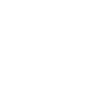

In [99]:
#Recuperación del path desde un track parcial del Retiro
LineString(gpd.GeoDataFrame.from_features(mapping(miretiro)['features']).geometry)

In [137]:
rides.sample(20)

,_id,unplug_hourTime,is_day_off,travel_time,idunplug_station,idplug_station,orig_to_Retiro,dest_to_Retiro,user_type,ageRange,zip_code,has_multiple_rides,multiple_rides_cluster_size,user_day_code,track,full_track,shapely_track,retiro_speed
unplug_hourTime,,,,,,,,,,,,,,,,,,
2018-08-23 16:00:00+02:00,5b847a342f384345a495b80d,2018-08-23 16:00:00+02:00,False,876,171,55,1236.1302809,509.7177085,1,4,28005,True,2,4d1d4af8932d67fadaa5bbb3532968732b9323dd902ce9...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6935205 40.4075606, -3.69189759...",7.1950000
2018-08-22 08:00:00+02:00,5b8329002f3843545085a752,2018-08-22 08:00:00+02:00,False,959,48,94,1338.2671195,805.4129211,1,4,28045,True,2,c38e45c269d1dd754158f92b9d9d8892c84d37964cb26a...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6752024 40.4272582, -3.6756085 ...",6.1400000
2018-08-16 18:00:00+02:00,5b7b40322f384345984d6306,2018-08-16 18:00:00+02:00,False,5637,105,104,682.7422753,781.2524454,2,0,None,False,1,82fe59157b7cb4ef1531810c0b43692c2ac9ba242e6e6d...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6738714 40.4261851, -3.6741651 ...",4.7842857
2018-08-21 08:00:00+02:00,5b81d6c72f384362d4e9f43c,2018-08-21 08:00:00+02:00,False,898,82,95,916.5817190,490.2849000,1,4,28007,False,1,b2232b4c05853664155a4a2e74d8ff42ff490d438f1428...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6837876 40.4250361, -3.68256799...",6.9866667
2018-08-01 07:00:00+02:00,5b6779082f384302541d6da5,2018-08-01 07:00:00+02:00,False,844,79,108,32.0577925,1115.3887596,1,5,28007,True,2,493d57e5c67167c5a4d83608595441f215d9b9766a6a0a...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6865654 40.4303057, -3.6866368 ...",6.5150000
2018-08-24 14:00:00+02:00,5b85cc3a2f38431ee8e495bc,2018-08-24 14:00:00+02:00,False,490,90,44,46.9439677,1399.0137560,1,0,None,False,1,5bf346ca159322a013bc93accec37b87ce3765d6c1a578...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.7049407 40.4138846, -3.7035901 ...",4.8550000
2018-08-02 19:00:00+02:00,5b68cac52f38433e00de1018,2018-08-02 19:00:00+02:00,False,3343,78,78,28.7956614,28.7956614,2,0,None,False,1,15b09db0fe7b8c5568b0ec1f5a1ecbf04185a7620d3b82...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6766813 40.4117627, -3.6766093 ...",2.1956098
2018-08-16 08:00:00+02:00,5b7b400e2f384345984d47ef,2018-08-16 08:00:00+02:00,False,610,55,98,509.7177085,680.0808988,1,5,28045,True,3,a15ff97f053aa2b3fb6292012769c18eaa56d397b43212...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6893698 40.4257046, -3.6888333 ...",6.1675000
2018-08-23 12:00:00+02:00,5b847a272f384345a495adeb,2018-08-23 12:00:00+02:00,False,2236,33,114,611.2833426,1068.8053943,1,5,28028,False,1,c424deac3cd04ed5f3338f91e1130857ad7424162c6653...,"{'type': 'FeatureCollection', 'features': [{'g...","{'type': 'FeatureCollection', 'features': [{'g...","LINESTRING (-3.6706024 40.4273005, -3.67118309...",5.1925000


In [159]:
%time rides['retiro_speed'] = pd.Series(map(lambda t : get_retiro_speed(t), rides['track']), index=rides.index)

Wall time: 34.8 s


In [140]:
%time rides['retiro_rate'] = pd.Series(map(lambda t : get_retiro_rate(t), rides['track']), index=rides.index)

Wall time: 34.2 s


In [141]:
%time rides['retiro_track'] = pd.Series(map(lambda t : get_retiro_track(t), rides['track']), index=rides.index)

Wall time: 1min 40s


#### Outliers relacionados con un tracking anómalo del GPS (velocidad y posición)

In [162]:
rides.describe()

,travel_time,orig_to_Retiro,dest_to_Retiro,multiple_rides_cluster_size,retiro_speed,retiro_rate
count,21361.0000000,21361.0000000,21361.0000000,21361.0000000,21361.0000000,21361.0000000
mean,1485.7499181,749.8188895,741.3851942,1.5293760,18.2883291,0.3971944
std,1747.7306117,731.3987700,703.5821207,0.7177464,6.0091262,0.2045025
min,150.0000000,28.7956614,28.7956614,1.0000000,0.0000000,0.0070423
25%,662.0000000,194.2148666,173.0740571,1.0000000,14.0760000,0.2500000
50%,919.0000000,653.0254515,653.0254515,1.0000000,19.2240000,0.3571429
75%,1421.0000000,1038.9932074,1068.8053943,2.0000000,22.7610000,0.5000000
max,21132.0000000,4356.5915106,4356.5915106,6.0000000,84.6000000,1.0000000


En cuanto a la velocidad, el máximo de **84km/h** es llamativo. Representando los tracks sobre el mapa con varios cortes de velocidad media se constata que los 11 trayectos con **más de 35km/h** de velocidad media parecen corresponderse con fallos en el GPS que ha generado un punto anómalo dentro del parque con una velocidad aberrante. Vamos a retirarlos del dataset.

In [276]:
len(rides[rides['retiro_speed']>35])

24

In [281]:
#Trayectos que refieren una velocidad media dentro del Retiro de más de 35 km/h, aparentemente anómalos.
mapa = folium.Map([40.4155068, -3.6840015], zoom_start=15)
for i,p in rides[rides['retiro_speed']>35].iterrows():
    r=folium.features.GeoJson(mapping(p.shapely_track), tooltip="Velocidad media dentro del Retiro: "+str("%.2f" % p.retiro_speed))
    r.style_function=lambda x: {'color':'red', 'weight':2, 'opacity':.7}
    mapa.add_child(r)
mapa.save('max_speed.html')
mapa

También es raro el mínimo de **0km/h** que parece corresponderse con trayectos contiguos al Retiro con una **incursión mínima** en el parque a velocidad nula.

In [276]:
len(rides[rides['retiro_speed']==0])

24

In [279]:
#Trayectos que refieren una velocidad media dentro del Retiro de 0km/h.
mapa = folium.Map([40.4155068, -3.6840015], zoom_start=15)
for i,p in rides[rides['retiro_speed']==0].iterrows():
    r=folium.features.GeoJson(mapping(p.shapely_track), tooltip="Velocidad media dentro del Retiro: "+str("%.2f" % p.retiro_speed))
    r.style_function=lambda x: {'color':'red', 'weight':2, 'opacity':.7}
    mapa.add_child(r)
mapa.save('0speed.html')
mapa

In [233]:
rides.reset_index(drop=True, inplace=True)

Retiramos los trayectos (35 en total) con velocidades medias anómalas.

In [282]:
rides.drop(rides[rides['retiro_speed']>35].index, inplace=True)

In [283]:
rides.drop(rides[rides['retiro_speed']==0].index, inplace=True)

Ahora veamos cómo se comportan los trayectos que, supuestamente, sólo han permanecido dentro del parque.
Como es lógico, la mayoría son trayectos cuyas bicis han sido retiradas y devueltas en estaciones muy próximas al parque. Sin embargo se observan situaciones "imposibles" como retirar o devolver la bici en estaciones demasiado lejanas, lo cuál implica haber circulado también fuera del parque, y sin embargo el tracking GPS no refleja este hecho. Eso aún constatando que hay hasta 2 minutos "de gracia" desde el desenganche de la bicicleta antes de la generación del primer trackpoint.

In [298]:
rides[rides['retiro_rate']==1].describe()

,travel_time,orig_to_Retiro,dest_to_Retiro,multiple_rides_cluster_size,retiro_speed,retiro_rate
count,194.0000000,194.0000000,194.0000000,194.0000000,194.0000000,194.0
mean,999.2268041,348.8242444,244.6340158,1.5309278,17.2675217,1.0
std,1019.3913607,401.9536336,403.9508396,0.6609556,6.0470621,0.0
min,197.0000000,28.7956614,28.7956614,1.0000000,0.8280000,1.0
25%,386.0000000,46.9439677,46.9439677,1.0000000,13.9933636,1.0
50%,578.5000000,189.0946108,71.4404537,1.0000000,17.8551000,1.0
75%,1173.5000000,509.7177085,239.5170038,2.0000000,21.3930000,1.0
max,6584.0000000,2110.2134409,2110.2134409,4.0000000,28.2960000,1.0


In [342]:
#Trayectos que comienzan O terminan demasiado lejos del parque (>400 metros) como para considerarlos "100% dentro del parque"
mapa = folium.Map([40.4155068, -3.6840015], zoom_start=14)
for i,p in rides[(rides['retiro_rate']==1) & ((rides['orig_to_Retiro']>400) | (rides['dest_to_Retiro']>400))].iterrows():
    r=folium.features.GeoJson(mapping(p.shapely_track), tooltip="Origen: "+str("%.2f" % p.orig_to_Retiro)+" Destino: "+str("%.2f" % p.dest_to_Retiro))
    r.style_function=lambda x: {'color':'red', 'weight':1.5, 'opacity':.5}
    mapa.add_child(r)
mapa.save('too_far_100%_retiro.html')
mapa

In [316]:
len(rides[(rides['retiro_rate']==1) & ((rides['orig_to_Retiro']>400) | (rides['dest_to_Retiro']>400))])

85

Después de alguna comprobaciones sobre el mapa, consideraremos algo anómalo el retirar o devolver una bici en estaciones **a más de 400 metros** del parque pero que el track sólo refleje puntos dentro del mismo.

Retiramos estos trayectos (85 en total)

In [343]:
rides.drop(rides[(rides['retiro_rate']==1) & ((rides['orig_to_Retiro']>400) | (rides['dest_to_Retiro']>400))].index,
           inplace=True)

In [442]:
len(rides)

21241

In [345]:
rides.describe()

,travel_time,orig_to_Retiro,dest_to_Retiro,multiple_rides_cluster_size,retiro_speed,retiro_rate
count,21241.0000000,21241.0000000,21241.0000000,21241.0000000,21241.0000000,21241.0000000
mean,1485.1649169,749.9692024,742.4237227,1.5301069,18.2934233,0.3952242
std,1742.7618047,732.1593305,703.8042281,0.7181727,5.9290271,0.2010811
min,150.0000000,28.7956614,28.7956614,1.0000000,0.6480000,0.0070423
25%,662.0000000,194.2148666,173.0740571,1.0000000,14.0800000,0.2500000
50%,920.0000000,653.0254515,653.0254515,1.0000000,19.2240000,0.3571429
75%,1421.0000000,1038.9932074,1068.8053943,2.0000000,22.7610000,0.5000000
max,21132.0000000,4356.5915106,4356.5915106,6.0000000,33.9840000,1.0000000


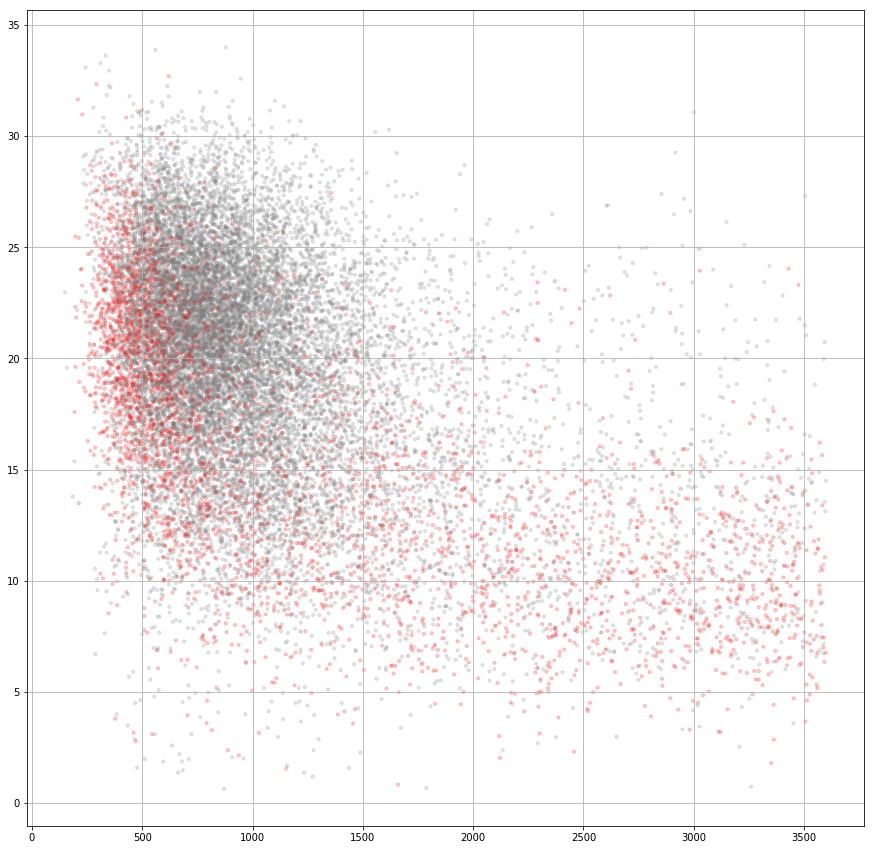

In [441]:
fig, ax = plt.subplots(figsize=(15,15))
col = np.where(rides[rides['travel_time']<3600].retiro_rate<=0.5,'gray',np.where(rides[rides['travel_time']<3600].retiro_rate<=1,'r','r'))
ax.scatter(rides[rides['travel_time']<3600].travel_time, rides[rides['travel_time']<3600].retiro_speed, s=10, c=col, alpha=.2)
ax.grid(True)
plt.show()

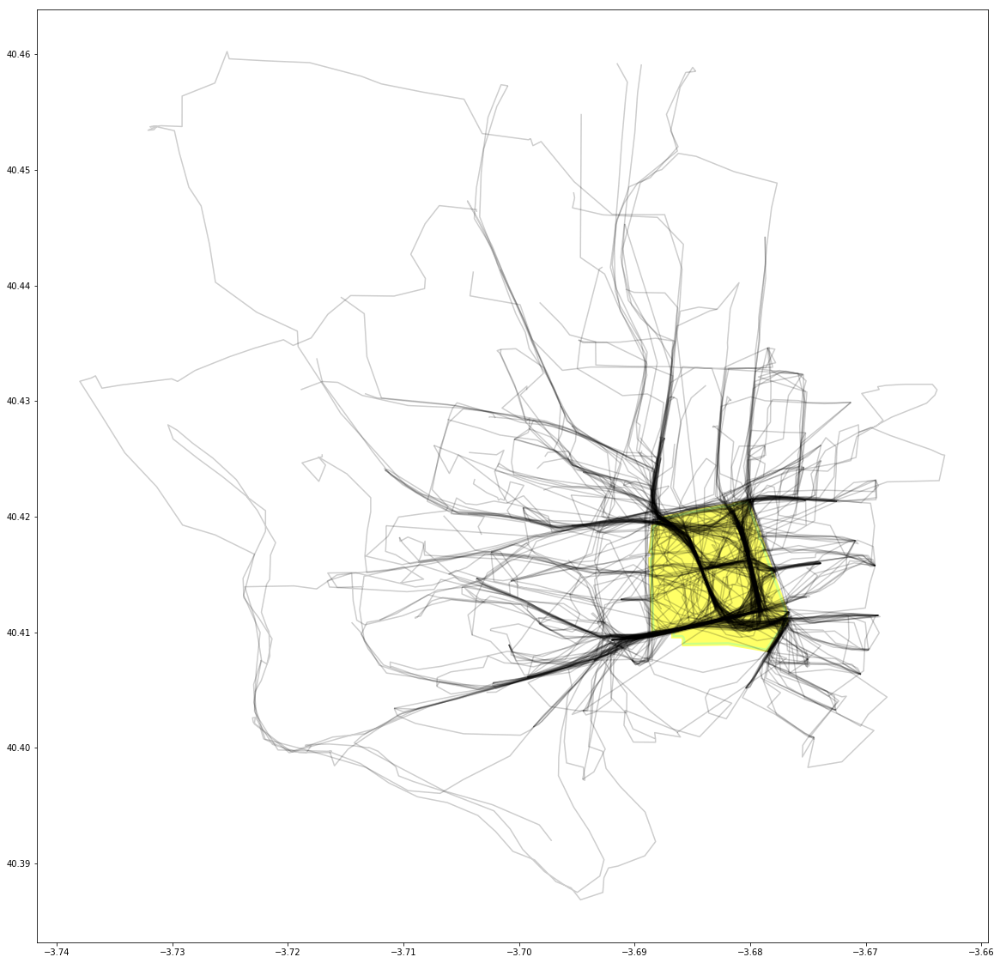

In [256]:
ax=raw_retiro.plot(figsize=[20,20], color='yellow', alpha=0.6)
#add_basemap(ax, zoom=10)
borde.plot(ax=ax, color='cyan', alpha=0.2)
pointsInRetiro.plot(ax=ax, color='black', alpha=0.1)
#pointsNotInRetiro.plot(ax=ax, color='red', alpha=0.1)

In [449]:
#August 26th this user made the same round trip 3 times with 3 different bikes in the morning, in the afternoon and in the evening.
mapa = folium.Map([40.4155068, -3.6840015], zoom_start=15)
for p in rides[rides['_id']=='5b6779062f384302541d6c36']['shapely_track']:
    r=folium.features.GeoJson(mapping(p))
    r.style_function=lambda x: {'color':'green', 'weight':2, 'opacity':.7}
    mapa.add_child(r)
mapa

In [364]:
#Vamos a aligerar el dataframe quitando la columna track pues tenemos el full_track disponible
rides = rides.drop(['track'], axis=1)